# `hw3`: Model comparison

In [2]:
# Fill in this cell with your personal details:
# - Name: Mvomo Eto Wilfried
# - Student ID: s226625
# - Email: Wilfried.Mvomoeto@student.uliege.be

In this homework, you will have to create new probabilistic models of the production of the photovoltaic panels installed on the ULiège campus, and criticize them. You will use the model from Homework 2 for comparison.

Deadline: **Friday, December 15**.

- Submit your completed notebook on your personal Github repository created when accepting the assignment.
- All cells must be executable and their outputs should not be erased before submission.
- Homeworks are carried out alone.

# Model 2: photovoltaic production model with month-by-month uncertainties

In this homework, we consider a model where the production $P_{t}$ of the photovoltaic panels (when $\phi^s_{t} > 0.1$, see below) is assumed to follow

\begin{align}
    P_{1:T} &\sim \mathcal{N}(\eta A \frac{F_{1:T}}{\sin \phi^s_{1:T}} \cos(\alpha(\theta^s_{1:T}, \phi^s_{1:T}, \theta^p, \phi^p)), \sigma_{m(t)}^2)
\end{align}

where the inputs are

- $F_{t} \in \mathbb{R}$ the horizontal irradiance forecast,
- $\theta_{t}^s \in \mathbb{R}$ the sun azimuth,
- $\phi_{t}^s \in \mathbb{R}$ the sun elevation (assumed greater than $0.1$),

the parameters, with their own prior distributions, are

- $\sigma_{m(t)}^2 \in \mathbb{R}^+$ the variance for month $m(t)$,
- $\eta \in [0, 1]$ the panels efficiency coefficient,
- $\theta^p \in \mathbb{R}$ the azimuth of the normal of the panel,
- $\phi^p \in \mathbb{R}$ the elevation of the normal of the panel,

the constants are

- $A = 2600 \space \text{m}^2$ the area of photovoltaic panels,

and $\alpha(\theta^s_{t}, \phi^s_{t}, \theta^p, \phi^p)$ denotes the angle between the sun orientation $(\theta^s_{t}, \phi^s_{t})$ and the panel orientation $(\theta^p, \phi^p)$.

The data is extracted from Homework 1 by selecting the rows for which the sun elevation $\phi^s_{t}$ is above $0.1$ and is available in `data/power.csv`. The columns are defined as 
- `irradiance`: the horizontal irradiance forecast $F_t$ (W / m2),
- `irradiance_top`: the solar irradiance forecast at the top of the atmosphere (W / m2),
- `power`: the power production of the photovoltaic panels $P_t$ (W),
- `sun_azimuth`: the azimuth of the sun $\theta^s_t$ (rad),
- `sun_elevation`: the elevation of the sun $\phi^s_t$ (rad).

<div class="alert alert-info">
    
**Information**. We provide the function `cosine_orentations` that takes as inputs the sun orientation $(\theta^s_{1:T}, \phi^s_{1:T})$ and the panel orientation $(\theta^p, \phi^p)$ and outputs the cosine $\cos(\alpha(\theta^s_{t}, \phi^s_{t}, \theta^p, \phi^p))$ of the angle between these orientations.
    
</div>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error
from scipy.optimize import minimize
from sklearn.model_selection import KFold
from tqdm import tqdm 
from scipy import stats 
from scipy.stats import uniform, norm, gamma

In [5]:
def coordinates(theta, phi):
    x = np.cos(theta) * np.cos(phi)
    y = np.sin(theta) * np.cos(phi)
    z = np.sin(phi)
    return x, y, z
    
def cosine_orientations(theta_s, phi_s, theta_p, phi_p):
    xs, ys, zs = coordinates(theta_s, phi_s)
    xp, yp, zp = coordinates(theta_p, phi_p)
    return xs * xp + ys * yp + zs * zp

<div class="alert alert-success">
    
**Exercise**. Load data from file `data/power.csv`.

</div>

<div class="alert alert-danger">

**NB**. The column swap in file `data/power.csv` was fixed, you do not need to alter it for this homework.

</div>

In [6]:
data = pd.read_csv( r'./data/power.csv')
print(data.info())
data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14683 entries, 0 to 14682
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   datetime        14683 non-null  object 
 1   irradiance      14683 non-null  float64
 2   irradiance_top  14683 non-null  float64
 3   power           14683 non-null  float64
 4   sun_azimuth     14683 non-null  float64
 5   sun_elevation   14683 non-null  float64
dtypes: float64(5), object(1)
memory usage: 688.4+ KB
None


,datetime,irradiance,irradiance_top,power,sun_azimuth,sun_elevation
0,2022-01-01 08:45:00+00:00,23.47,99.59,31098.0,0.118582,2.441109
1,2022-01-01 09:00:00+00:00,46.19,169.79,35872.0,0.144492,2.495957
2,2022-01-01 09:15:00+00:00,67.58,217.01,38616.0,0.168565,2.551853
3,2022-01-01 09:30:00+00:00,84.97,245.87,42944.0,0.190690,2.608790
4,2022-01-01 09:45:00+00:00,101.96,272.25,50688.0,0.210761,2.666745


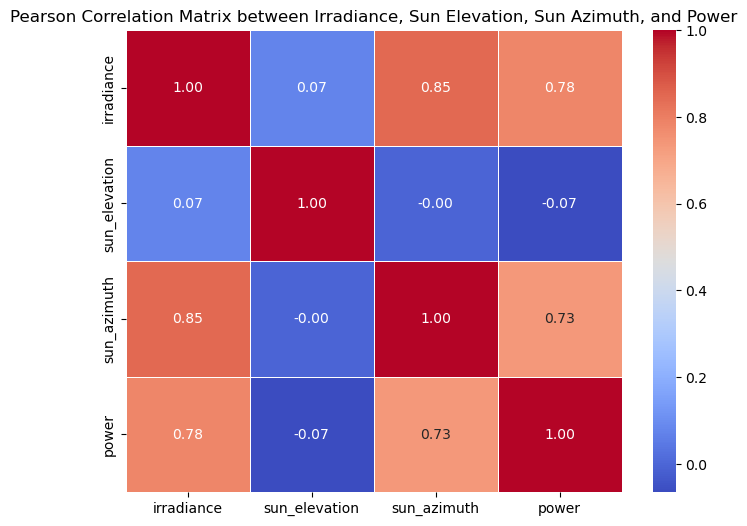

In [7]:
# Compute correlation matrix
correlation_matrix = data[['irradiance', 'sun_elevation', 'sun_azimuth', 'power']].corr()

# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Pearson Correlation Matrix between Irradiance, Sun Elevation, Sun Azimuth, and Power')
plt.show()

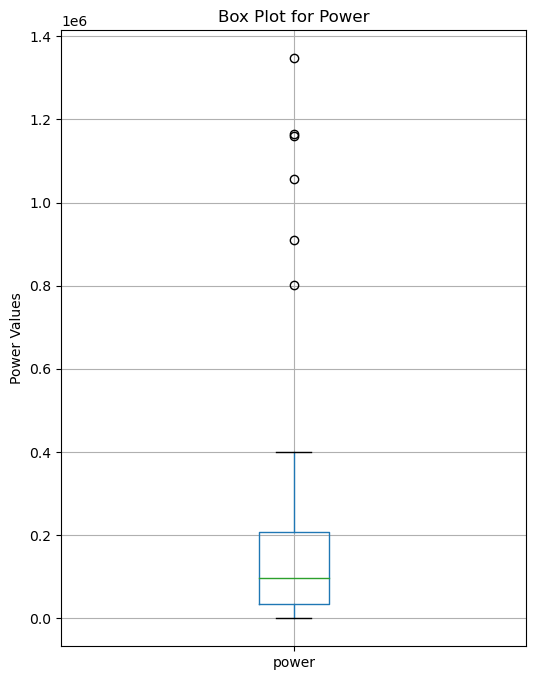

In [8]:
data[['power']].boxplot(figsize=(6, 8))
plt.title('Box Plot for Power')
plt.ylabel('Power Values')
plt.show()

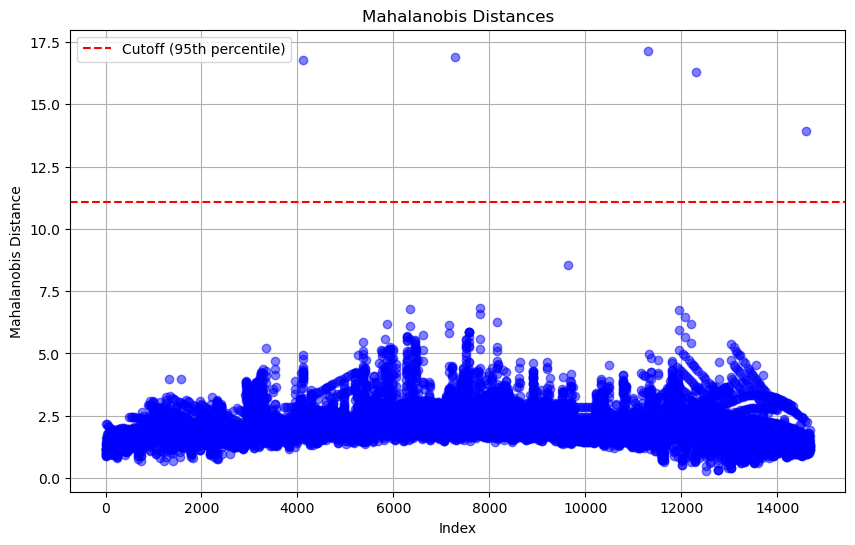

In [9]:
from scipy.spatial import distance
from scipy.stats import chi2

# Calculate the number of variables
num_variables = 5

# Calculate the quantile corresponding to the 95th percentile of the chi-square distribution
quantile = chi2.ppf(0.95, num_variables)
# Calculate the mean vector
mean_vector = data[['irradiance', 'irradiance_top', 'power', 'sun_azimuth', 'sun_elevation']].mean()

# Calculate the covariance matrix
cov_matrix = data[['irradiance', 'irradiance_top', 'power', 'sun_azimuth', 'sun_elevation']].cov()

# Compute the inverse of the covariance matrix
inv_cov_matrix = np.linalg.inv(cov_matrix)

# Calculate Mahalanobis distance for each data point
mahalanobis_distances = []
for index, row in data.iterrows():
    data_point = row[['irradiance', 'irradiance_top', 'power', 'sun_azimuth', 'sun_elevation']]
    mahalanobis_distance = distance.mahalanobis(data_point, mean_vector, inv_cov_matrix)
    mahalanobis_distances.append(mahalanobis_distance)

# Add the Mahalanobis distances as a new column to your DataFrame
data['mahalanobis_distance'] = mahalanobis_distances

# Plot Mahalanobis distances
plt.figure(figsize=(10, 6))
plt.plot(data.index, data['mahalanobis_distance'], marker='o', linestyle='', color='blue', alpha=0.5)
plt.axhline(y=quantile, color='red', linestyle='--', label='Cutoff (95th percentile)')
plt.title('Mahalanobis Distances')
plt.xlabel('Index')
plt.ylabel('Mahalanobis Distance')
plt.legend()
plt.grid(True)
plt.show()

In [10]:
# Determine observations above cutoff
above_cutoff = data[data['mahalanobis_distance'] > quantile]
num_above_cutoff = len(above_cutoff)
print("Number of observations above cutoff:", num_above_cutoff)

# Delete observations above cutoff
data = data[data['mahalanobis_distance'] <= quantile]

Number of observations above cutoff: 5


Only four observations are above the cutoff. We delete them for the next.

<div class="alert alert-success">
    
**Exercise**. Motivate your choice of priors $p(\sigma_1^2, \dots, \sigma_{12}^2)$, $p(\eta)$, $p(\theta^p)$, $p(\phi^p)$.
    
</div>

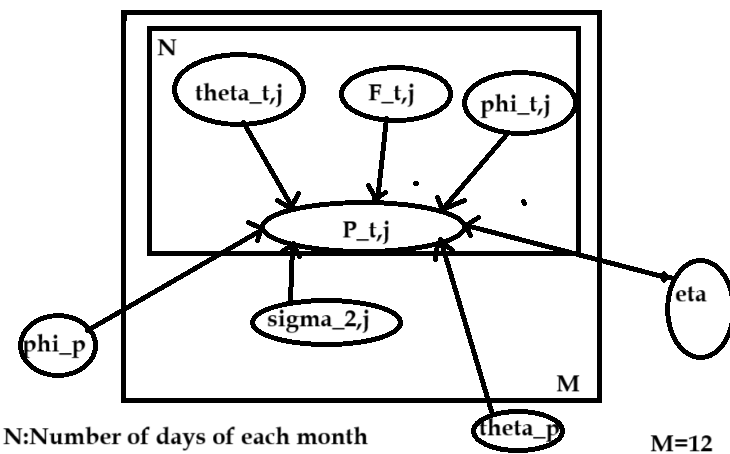

In [11]:
from IPython.display import Image, display
display(Image(filename=r'./p.png'))

Prior predictive checks

In [12]:
# Convert the "datetime" column to datetime type
data['datetime'] = pd.to_datetime(data['datetime'])

# Create a new column with formatted date
data['formatted_date'] = data['datetime'].dt.strftime('%Y-%m-%d')

# Extract the month from each date
data['month'] = data['datetime'].dt.month.copy()  # Use .copy() to avoid SettingWithCopyWarning

# Group by month
grouped = data.groupby('month')

# Find the first and last day of each month
first_days = grouped['datetime'].min()
last_days = grouped['datetime'].max()

# Display the results
for month, first_day, last_day in zip(first_days.index, first_days, last_days):
    print(f"Month: {month}, First day: {first_day.date()}, Last day: {last_day.date()}")

Month: 1, First day: 2022-01-01, Last day: 2022-01-31
Month: 2, First day: 2022-02-01, Last day: 2022-02-28
Month: 3, First day: 2022-03-01, Last day: 2022-03-31
Month: 4, First day: 2022-04-01, Last day: 2022-04-30
Month: 5, First day: 2022-05-01, Last day: 2022-05-31
Month: 6, First day: 2022-06-01, Last day: 2022-06-30
Month: 7, First day: 2022-07-01, Last day: 2022-07-31
Month: 8, First day: 2022-08-01, Last day: 2022-08-30
Month: 9, First day: 2022-09-01, Last day: 2022-09-30
Month: 10, First day: 2022-10-01, Last day: 2022-10-31
Month: 11, First day: 2022-11-01, Last day: 2022-11-30
Month: 12, First day: 2022-12-01, Last day: 2022-12-31


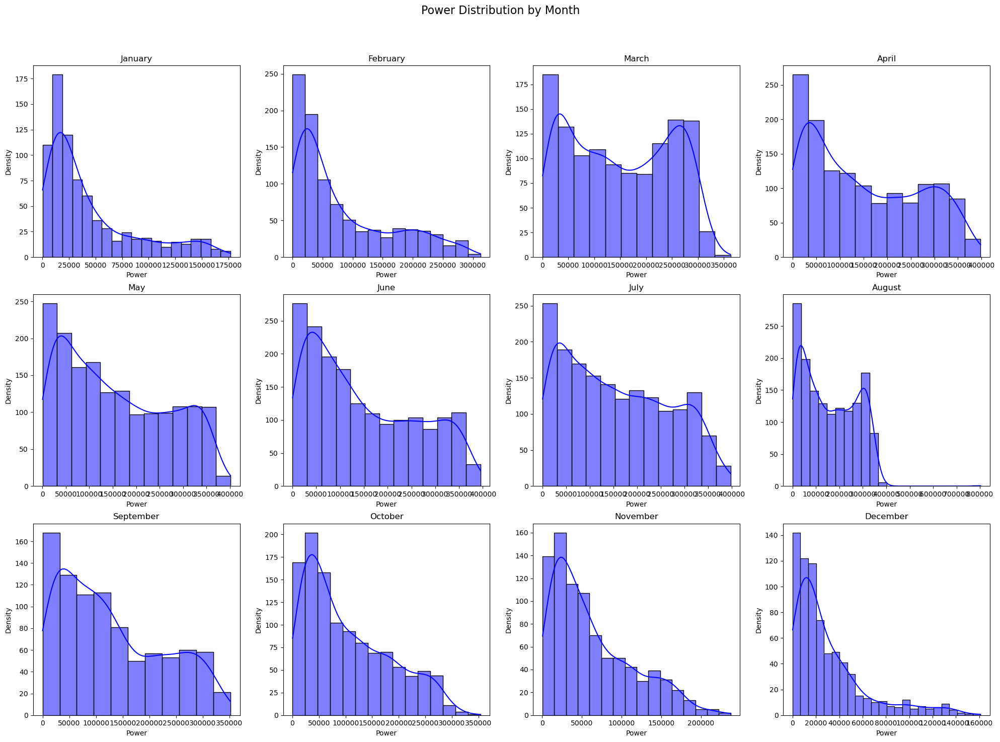

In [13]:
import calendar

# Convert 'datetime' column to datetime format
data['datetime'] = pd.to_datetime(data['datetime'])

# Extract month from the datetime
data['month_name'] = data['datetime'].dt.month_name()

# Convert date to datetime type
data['formatted_date'] = pd.to_datetime(data['formatted_date'])

# Create a grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
fig.suptitle('Power Distribution by Month', fontsize=16)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over each month
for month in range(1, 13):
    # Filter data for the current month
    data_month = data[data['datetime'].dt.month == month]
    
    # Plot KDE of 'power' column for the current month
    sns.histplot(data=data_month['power'], kde=True, ax=axes[month - 1], color='blue')
    axes[month - 1].set_title(calendar.month_name[month])
    axes[month - 1].set_xlabel('Power')
    axes[month - 1].set_ylabel('Density')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

We should provide the prior distributions of the model parameters for each month. Fortunately, we notice some similarities in term of power production between some months.

Prior predictive checks

In [14]:
data_ = data.copy()
# Define a simulate function allowing to simulate data for a given date
def simulate_mod2(F_t, theta_s, phi_s, date, theta):
    A = 2600
    
    if theta[0] < 0 or theta[0] > 1:
        print("eta must be in the range [0, 1]")
    else:
        cos_alpha = cosine_orientations(theta_s, phi_s, theta[1], theta[2])
        month = date.dt.month  # Extract the month from the date
        day = date.dt.day  # Extract the day from the date
        
        if ((month == 1) & (day >= 1) & (day <= 31)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 2) & (day >= 1) & (day <= 28)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 3) & (day >= 1) & (day <= 31)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 4) & (day >= 1) & (day <= 30)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 5) & (day >= 1) & (day <= 31)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 6) & (day >= 1) & (day <= 30)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 7) & (day >= 1) & (day <= 31)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 8) & (day >= 1) & (day <= 30)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 9) & (day >= 1) & (day <= 30)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 10) & (day >= 1) & (day <= 31)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 11) & (day >= 1) & (day <= 30)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
        elif ((month == 12) & (day >= 1) & (day <= 31)).any():
            P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        else:
            print("Date not in the specified range")
    
    return P_t

In [15]:
# Use the prior distribution for each model parameter
def simulate_samples2(F_t, theta_s, phi_s, date, num):
    A = 2600
    eta_prior = uniform( loc=0, scale=1)
    theta_p_prior = norm(loc=0, scale=4 * np.pi)
    phi_p_prior = norm(loc=np.pi / 2, scale=10)

    # Simulate samples from the prior distributions
    eta_samples = eta_prior.rvs(size=num)  # Generate num samples for eta
    theta_p_samples = theta_p_prior.rvs(size=num)  # Generate num samples for theta_p
    phi_p_samples = phi_p_prior.rvs(size=num)  # Generate num samples for phi_p

    month = date.dt.month  # Extract the month from the date
    day = date.dt.day  # Extract the day from the date

    # Simulate power production samples using the provided simulation function
    power_production_samples = []

    for i in range(num):
        power_samples_i = []

        if ((month == 1) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 1]['power'].var() , 1e4)
        elif ((month == 2) & (day >= 1) & (day <= 28)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 2]['power'].var(), 1e4)
        elif ((month == 3) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 3]['power'].var(), 1e4)
        elif ((month == 4) & (day >= 1) & (day <= 30)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 4]['power'].var(), 1e4)
        elif ((month == 5) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 5]['power'].var(), 1e4)
        elif ((month == 6) & (day >= 1) & (day <= 30)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 6]['power'].var(), 1e4)
        elif ((month == 7) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 7]['power'].var(), 1e4)
        elif ((month == 8) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 8]['power'].var(), 1e4)
        elif ((month == 9) & (day >= 1) & (day <= 30)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 9]['power'].var(), 1e4)
        elif ((month == 10) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 10]['power'].var(), 1e4)
        elif ((month == 11) & (day >= 1) & (day <= 30)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 11]['power'].var(), 1e4)
        elif ((month == 12) & (day >= 1) & (day <= 31)).any():
            sigma_2_prior = stats.norm(data[data['datetime'].dt.month == 12]['power'].var(), 1e4)
        else:
            print("Date not in the specified range")
            return

        sigma_2_samples = sigma_2_prior.rvs()

        # Pass theta as a list of parameter values for each sample
        power_sample_t = simulate_mod2(F_t, theta_s, phi_s, date, [eta_samples[i], theta_p_samples[i], phi_p_samples[i], sigma_2_samples])
        power_samples_i.append(power_sample_t)
        
        power_production_samples.append(power_samples_i)

    return power_production_samples

In [16]:
# Set data for each month
data_january = data[data['datetime'].dt.month == 1]
data_february = data[data['datetime'].dt.month == 2]
data_march = data[data['datetime'].dt.month == 3]
data_april = data[data['datetime'].dt.month == 4]
data_may = data[data['datetime'].dt.month == 5]
data_june = data[data['datetime'].dt.month == 6]
data_july = data[data['datetime'].dt.month == 7]
data_august = data[data['datetime'].dt.month == 8]
data_september = data[data['datetime'].dt.month == 9]
data_october = data[data['datetime'].dt.month == 10]
data_november = data[data['datetime'].dt.month == 11]
data_december = data[data['datetime'].dt.month == 12]

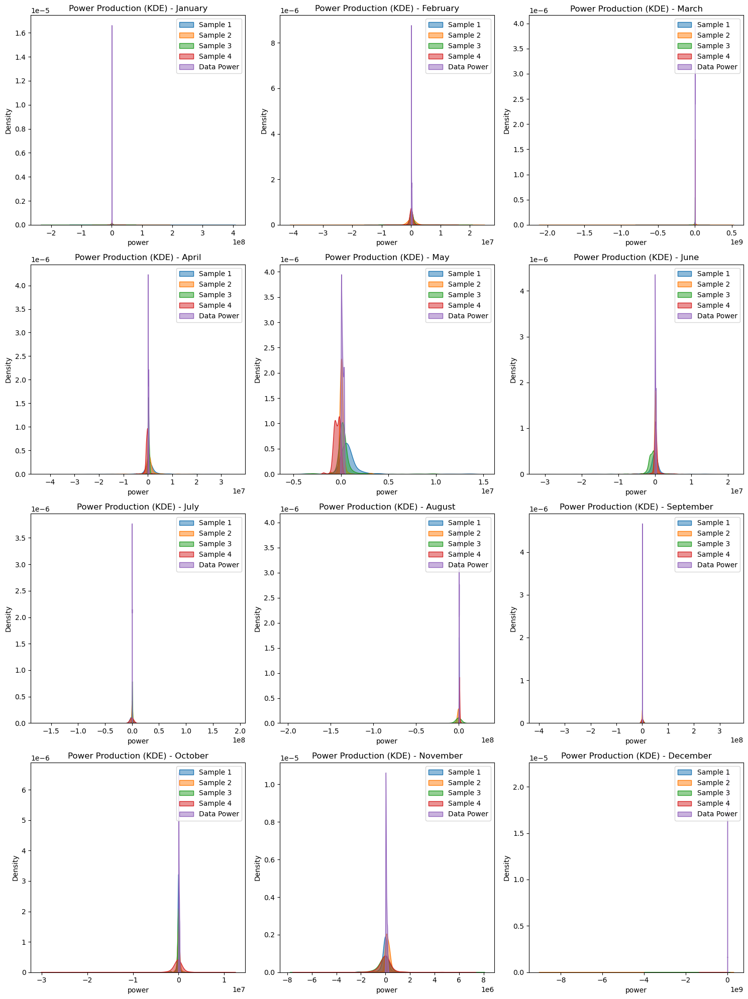

In [17]:
 # List of tuples containing data for each month along with the month name
months_data = [
    (data_january, 'January'),
    (data_february, 'February'),
    (data_march, 'March'),
    (data_april, 'April'),
    (data_may, 'May'),
    (data_june, 'June'),
    (data_july, 'July'),
    (data_august, 'August'),
    (data_september, 'September'),
    (data_october, 'October'),
    (data_november, 'November'),
    (data_december, 'December')
]

fig, axes = plt.subplots(4, 3, figsize=(15, 20))

for idx, (data, month) in enumerate(months_data):
    n_samples = 4

    # Call the function
    result_ = simulate_samples2(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['formatted_date'], num=n_samples)

    # Calculate the subplot position
    row = idx // 3
    col = idx % 3

    # Plot KDE for power production samples
    for i in range(n_samples):
        # Convert result_[i] to a NumPy array and then flatten it
        sns.kdeplot(np.array(result_[i]).flatten(), fill=True, alpha=0.5, label=f'Sample {i + 1}', ax=axes[row, col])

    sns.kdeplot(data['power'], fill=True, alpha=0.5, label='Data Power', ax=axes[row, col])
    axes[row, col].set_title(f'Power Production (KDE) - {month}')
    axes[row, col].legend()

plt.tight_layout()
plt.show()

 The choice of prior $p(\sigma_1^2, \dots, \sigma_{12}^2)$ is the joint of the normal distribution is mainly due to the fact that each $\sigma^2_{m(t)}$ is positive. Depending of the season, we adjust each normal distribution related to each $\sigma^2_{m(t)}$. We notice also that the parameters $\sigma^2_{m(t)}$ are independent.(*)
 
 We could define that panel's efficiency as a boolean (good or bad) that might lead us towards a beta law. But we do not get enough information about this aspect and thereby $\eta$ is oriented towards the uniform law $[0,1]$ because $\eta$ is only defined in $[0,1]$ and it is not defined according to the time $t$. Finally, $\theta^p$ is oriented towards the normal distribution since it is defined over $\mathbb{R}$ and we make the same choice for $\phi^p$.

$\sum_{m=1}^{12} \sigma_m^2$ =  $\sigma^2$ according to (*).


<div class="alert alert-success">
    
**Exercise**. Use MCMC to sample from the posterior probability density function $p(\sigma_1^2, \dots, \sigma_{12}^2, \eta, \theta^p, \phi^p | P_{1:T}, F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T})$. Plot the resulting chains and the obtained estimated posterior density function. Discuss the results.
    
</div>

We have : $$
p(\sigma_1^2, \cdots, \sigma_{12}^2, \eta, \theta^p, \phi^p | P_{1:T}, F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T})$$ $\propto$ $$ p(\eta) \cdot p(\theta^p) \cdot p(\phi^p) \cdot p(P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T} | \sigma_1^2, \cdots, \sigma_{12}^2, \eta, \theta^p, \phi^p) \cdot {\prod_{j=1}^{12}p(\sigma_j^2)}
$$

Therefore :

$$\log(p(\sigma_1^2, \cdots, \sigma_{12}^2, \eta, \theta^p, \phi^p |P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T}))$$  $\propto$ $${\sum_{j=1}^{12}\log(p(\sigma_j^2)} + \log(p(\theta^p)) + \log(p(\phi^p)) + \log(p(\eta)) + \log(p(P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T} | \sigma_1^2, \cdots, \sigma_{12}^2, \eta, \theta^p, \phi^p))$$.

In order to obtain $p(P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T} | \sigma_1^2, \cdots, \sigma_{12}^2, \eta, \theta^p, \phi^p)$, we can use the model of the previous project where $P_t$ is defined by : 

\begin{align}
   P_{1:T} &\sim \mathcal{N}(\eta A \frac{F_{1:T}}{\sin \phi^s_{1:T}} \cos(\alpha(\theta^s_{1:T}, \phi^s_{1:T}, \theta^p, \phi^p)), \sigma^2 1)
\end{align}

Since : $\sum_{m=1}^{12} \sigma_m^2$ =  $\sigma^2$, thereby we have :  
\begin{align}
   P_{1:T} &\sim \mathcal{N}(\eta A \frac{F_{1:T}}{\sin \phi^s_{1:T}} \cos(\alpha(\theta^s_{1:T}, \phi^s_{1:T}, \theta^p, \phi^p)), \sum_{m=1}^{12} \sigma_m^2 1) 
\end{align}

Fitting the parameters $(\sigma^2_1, \dots ,\sigma^2_{12}, \eta, \theta^p, \phi^p)$ by maximum likelihood estimation on the power production $P_{1:T}$ observed for inputs $(F_{1:T}, \phi^s_{1:T}, \alpha_{1:T})$ in the dataset.

In [18]:
np.random.seed(2)
data = data_.copy()
# Function to calculate log likelihood
def log_likelihood_mod2(theta, F_t, theta_s, phi_s, P_t):
    cos_alpha = cosine_orientations(theta_s, phi_s, theta[1], theta[2])
    scale = np.sqrt(np.sum(theta[3:])) 
    return np.sum(stats.norm.logpdf(P_t, loc=2600 * theta[0] * F_t * (1 / np.sin(phi_s)) * cos_alpha, scale=scale))

# Function to calculate negative log likelihood
def neg_log_likelihood_mod2(theta, F_t, theta_s, phi_s, P_t):
    return -log_likelihood_mod2(theta, F_t, theta_s, phi_s, P_t)

# Initialize initial_params with the variance of each month
initial_params = [uniform(0, 1).rvs(), norm(0, np.pi).rvs(), norm(np.pi / 2, 1/8 * 1e-2).rvs()]

for j in range(1, 13):
    month_data = data[data['month'] == j]
    initial_params.append(norm(month_data['power'].var(),1e4).rvs())

result = minimize(neg_log_likelihood_mod2, initial_params, args=(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['power']))
result

      fun: 199629.32125484745
 hess_inv: array([[ 6.07059795e-06, -1.12321704e-05, -2.00324142e-07,
         3.16829840e-09,  1.59497452e-14, -3.08093843e-14,
         1.07027978e-13,  1.13962114e-13, -1.67180681e-14,
         1.70509062e-15,  1.14801312e-14,  1.10625791e-14,
         1.75410865e-15, -7.84370014e-14, -9.45263269e-08],
       [-1.12321704e-05,  3.65413236e-02,  5.73653947e-05,
         4.48952827e-08, -1.57962707e-10,  1.07813012e-10,
        -7.71476908e-11, -8.19296343e-11, -7.45368452e-15,
         1.34624355e-14, -2.66706124e-14, -1.09777615e-10,
         1.57660155e-10, -5.53207729e-14,  9.57769252e-07],
       [-2.00324142e-07,  5.73653947e-05,  1.56122153e-06,
         6.86622587e-09, -2.01332756e-13,  1.35114810e-13,
        -1.41614837e-13, -1.50431260e-13, -3.45310752e-15,
         2.16678944e-15, -2.17006874e-15, -1.39888870e-13,
         1.93537362e-13, -1.91082535e-14,  1.23320418e-07],
       [ 3.16829840e-09,  4.48952827e-08,  6.86622587e-09,
         1.0

In [20]:
# Variances is a list containing the variance for each month
variances = []
for month_data in [data_january, data_february, data_march, data_april, data_may, data_june, data_july, data_august, data_september, data_october, data_november, data_december]:
    variances.append(month_data['power'].var())

# Define the log_prior
def log_prior_mod2(theta, variances):
    log_prior_eta = uniform.logpdf(theta[0], loc=0, scale=1)
    log_prior_theta_p = norm.logpdf(theta[1], loc=0, scale=4 * np.pi)
    log_prior_phi_p = norm.logpdf(theta[2], loc=np.pi / 2, scale=10)
    log_prior_sigma = np.sum(norm.logpdf(theta[3:], loc=variances, scale=1e4))
    return log_prior_eta + log_prior_phi_p + log_prior_theta_p + log_prior_sigma

# Define the log_posterior 
def log_posterior_mod2(theta, F_t, theta_s, phi_s, P_t, variances):
    lp = log_prior_mod2(theta, variances)
    if not np.isfinite(lp):
        return -np.inf
    return log_likelihood_mod2(theta, F_t, theta_s, phi_s, P_t) + lp

In [21]:
nwalkers, ndim = 60, len(initial_params)
pos = result.x + 0.001 * np.random.randn(nwalkers, ndim)

In [22]:
import emcee
sampler2 = emcee.EnsembleSampler(nwalkers, ndim, log_posterior_mod2, args=(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['power'], variances))
sampler2.run_mcmc(pos, 60000, progress=True);

100%|██████████████████████████████████████████████████████████████████████████| 60000/60000 [2:02:16<00:00,  8.18it/s]


In [23]:
tau = sampler2.get_autocorr_time()
tau

array([361.63374794, 352.80134397, 953.14973678, 383.39923568,
       358.57793389, 354.39544204, 380.67619297, 352.70881286,
       340.36732027, 359.27661904, 352.38936642, 370.0489334 ,
       361.66950093, 418.7245181 , 359.19089576])

The results show a significant correlation between successive samples in the MCMC chain, requiring on average around 360 samples to obtain an independent sample. Therefore the consecutive samples are highly correlated and that could prevent the sample to explore efficiently the parameter space and can require more iterations for getting more independent samples.

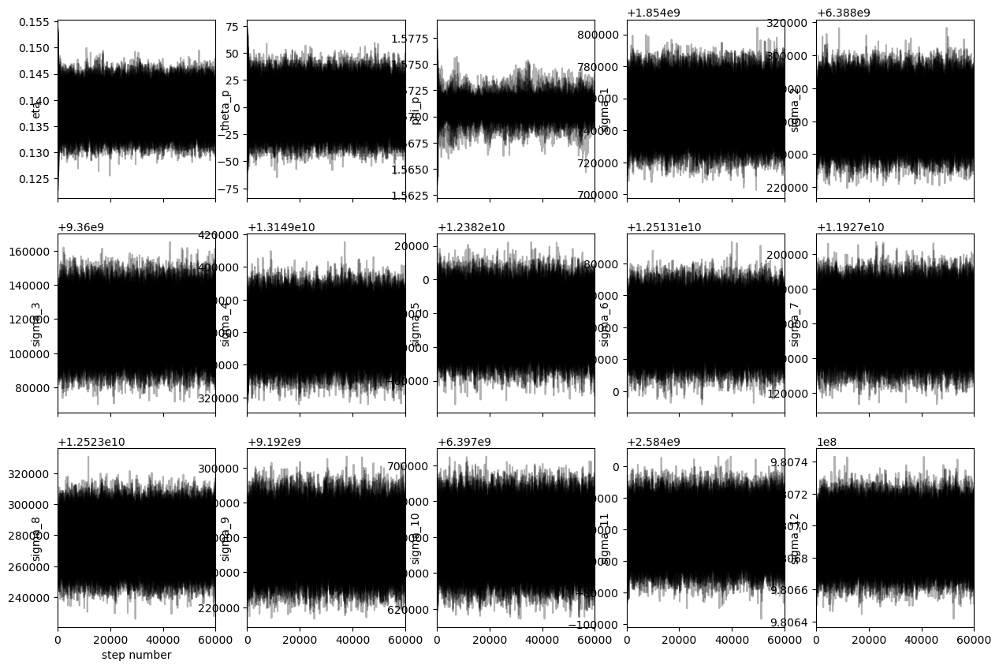

In [24]:
# Plot the resulting chains 
nrows = 3
ncols = 5

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10), sharex=True)
samples = sampler2.get_chain()
labels = ["eta", "theta_p", "phi_p"] + [f"sigma_{j}" for j in range(1, 13)]

for i in range(nrows):
    for j in range(ncols):
        ax = axes[i, j]
        index = i * ncols + j
        ax.plot(samples[:, :, index], "k", alpha=0.3)
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[index])
        ax.yaxis.set_label_coords(-0.1, 0.5)

# Add x-axis label to the last row
axes[-1, 0].set_xlabel("step number")
plt.show()

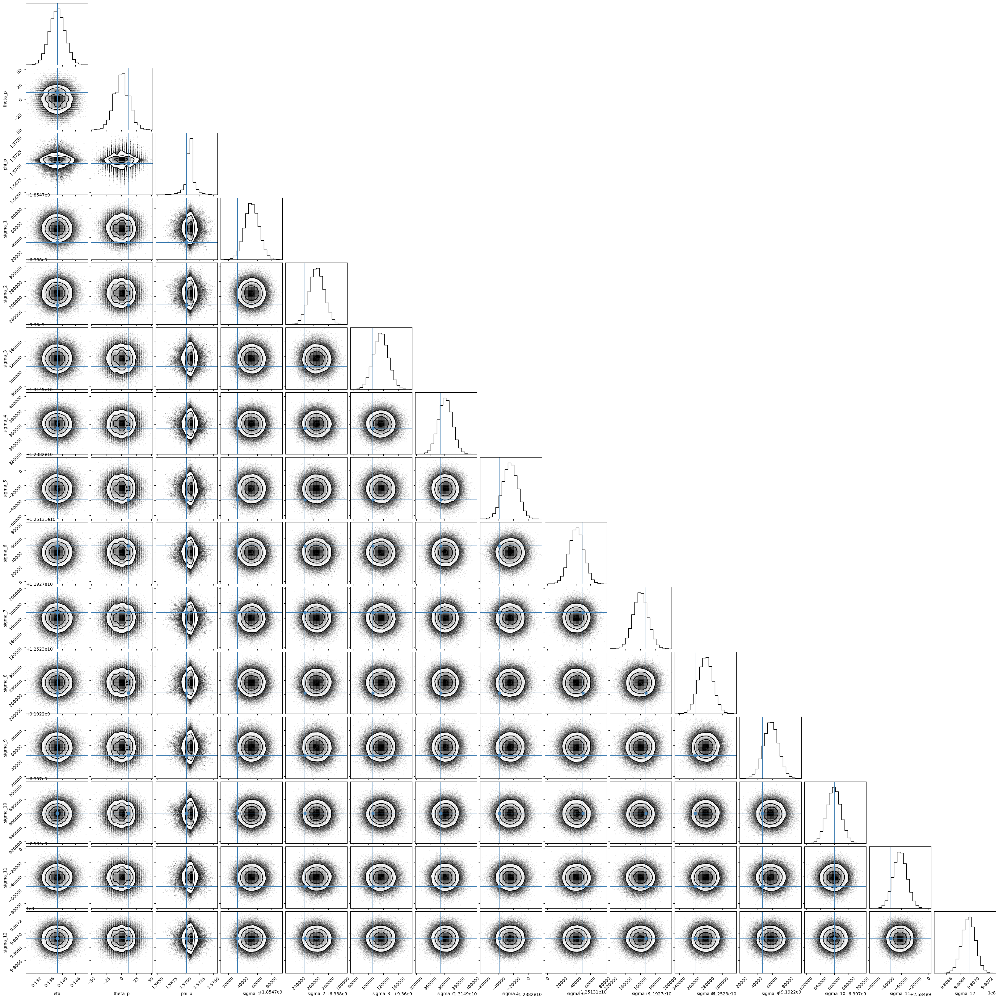

In [25]:
import corner
# Create a corner plot
thetas = sampler2.get_chain(flat=True, discard=2000, thin=45)
corner.corner(thetas, labels=labels, truths=result.x)
plt.show()

# Model 3: my own photovoltaic production model

<div class="alert alert-success">
    
**Exercise**. Define and motivate your own photovoltaic production model.
        
</div>

Given:

- $ F_t$ is the solar irradiance.
- $\theta_s$ and  $\phi_s$ are the solar zenith and azimuth angles, respectively.
- $\theta = [\eta, \theta_p, \phi_p, \sigma_1^2,\sigma_2^2,\sigma_3^2]$ are the parameters of the model, where:
  - $\eta$ represents a parameter controlling a certain aspect of the model.
  - $\theta_p$  represents another parameter related to the model.
  - $\phi_p$ represents yet another parameter.
  - $\sigma_{q(t)}^2$ represents the variance of energy production for each quarter of the year,
  
 we define our own model as follows:
  
$$ P_{1:T}\sim \mathcal{N}(\eta A \frac{F_{1:T}}{\sin \phi^s_{1:T}} \cos(\alpha(\theta^s_{1:T}, \phi^s_{1:T}, \theta^p, \phi^p)), \sigma_{q(t)}^2))
$$


This model generates a power production $P_t$ and we need to check out:
- First, we check if $\eta$  is within the range ]0, 1[.
- It calculates the cosine of the angle between the solar vector and the normal vector of the surface, denoted by $cos(\alpha)$, using $\theta_s$ and $\phi_s$.

In [26]:
# Define the simulate function of our own photovoltaic production model
def simulate_mod3(F_t, theta_s, phi_s, date, theta):
    A = 2600
    
    if theta[0] < 0 or theta[0] > 1:
        print("eta must be in the range [0, 1]")
        return None
    
    cos_alpha = cosine_orientations(theta_s, phi_s, theta[1], theta[2])
    month = date.dt.month  # Extract the month from the date
    day = date.dt.day  # Extract the day from the date
    
    # Define the conditions for each quadrimester of the year
    if ((month >= 1) & (month <= 4)).any():
        P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
    elif ((month >= 5) & (month <= 8)).any():
        P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
        
    elif ((month >= 9) & (month <= 12)).any():
        P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(theta[3]))
 
    else:
        print("Date not in the specified range")
        return None
    
    return P_t

<div class="alert alert-success">
    
**Exercise**. Fit the parameters of your model using any appropriate Bayesian inference algorithm on the power production $P_{1:T}$ observed for inputs $(F_{1:T}, \phi^s_{1:T}, \alpha_{1:T})$ in the provided dataset. If you assume prior distributions, motivate your choices.
    
</div>

Prior predictive check (since we assume the prior distributions).

In [27]:
# Set data for each quadrimestre
data_q1 = pd.concat([data_january, data_february, data_march, data_april])
data_q2 = pd.concat([data_may, data_june, data_july, data_august])
data_q3 = pd.concat([data_september, data_october, data_november, data_december])
data_q1.shape

(4351, 10)

In [28]:
def simulate_samples3(F_t, theta_s, phi_s, date, num):
    A = 2600
    eta_prior = stats.norm(0.13, 1e-3)
    theta_p_prior = stats.norm(0, np.pi)
    phi_p_prior = stats.norm(np.pi / 2, np.pi)

    # Simulate samples from the prior distributions
    eta_samples = eta_prior.rvs(size=num)
    theta_p_samples = theta_p_prior.rvs(size=num)
    phi_p_samples = phi_p_prior.rvs(size=num)

    # Extract the month from the date
    if isinstance(date, pd.Series) and hasattr(date.dt, 'month'):
        month = date.dt.month
    else:
        raise ValueError("Date must be a pandas Series with datetime64 dtype")

    # Define sigma_2_prior based on the quarter
    if ((month >= 1) & (month <= 4)).any():  # Q1
        sigma_2_prior = stats.norm(data_q1['power'].var(), 1e4)
    elif ((month >= 5) & (month <= 8)).any():  # Q2
        sigma_2_prior = stats.norm(data_q2['power'].var(), 1e4)
    elif ((month >= 9) & (month <= 12)).any():  # Q3
        sigma_2_prior = stats.norm(data_q3['power'].var(), 1e4)
    else:
        raise ValueError("Date not in the specified range")

    sigma_2_samples = sigma_2_prior.rvs(size=num)

    # Simulate power production samples using the provided simulation function
    power_production_samples = []

    for i in range(num):
        # Pass theta as a list of parameter values for each sample
        power_sample_t = simulate_mod3(
            F_t, theta_s, phi_s, date, 
            [eta_samples[i], theta_p_samples[i], phi_p_samples[i], sigma_2_samples[i]]
        )
        power_production_samples.append(power_sample_t)

    return power_production_samples

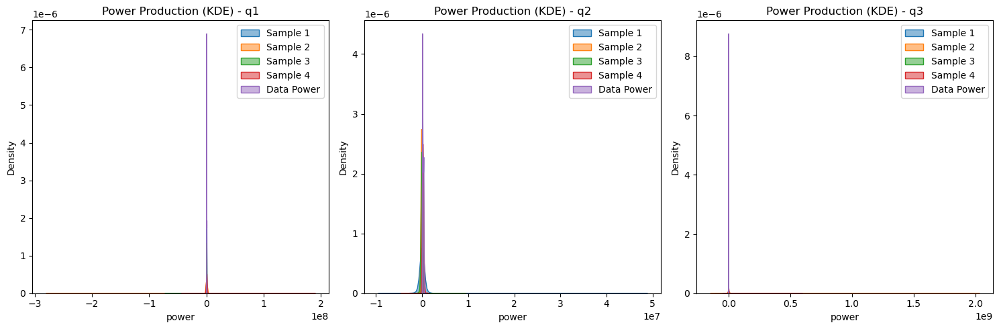

In [29]:
# List of tuples containing data for each quadrimestre along with the quadrimestre name
quadrimesters_data = [
    (data_q1, 'q1'),
    (data_q2, 'q2'),
    (data_q3, 'q3'),
]

# Create a figure with appropriate subplots
fig, axes = plt.subplots(1, len(quadrimesters_data), figsize=(15, 5))

for idx, (data, quadrimester) in enumerate(quadrimesters_data):
    n_samples = 4

    # Call the function
    result_ = simulate_samples3(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['formatted_date'], num=n_samples)

    # Plot KDE for power production samples
    for i in range(n_samples):
        # Convert result_[i] to a NumPy array and then flatten it
        sns.kdeplot(np.array(result_[i]).flatten(), fill=True, alpha=0.5, label=f'Sample {i + 1}', ax=axes[idx])

    sns.kdeplot(data['power'], fill=True, alpha=0.5, label='Data Power', ax=axes[idx])
    axes[idx].set_title(f'Power Production (KDE) - {quadrimester}')
    axes[idx].legend()

plt.tight_layout()
plt.show()

 The choice of prior $p(\sigma_1^2, \sigma_2^2, \sigma_{3}^2)$ is the joint of the normal distribution is mainly due to the fact that each $\sigma^2_{q(t)}$ is positive. Depending of the season, we adjust each normal distribution related to each $\sigma^2_{q(t)}$. We notice also that the parameters $\sigma^2_{q(t)}$ are independent.(*)
 
 We could define that panel's efficiency as a boolean (good or bad) that might lead us towards a beta law. But we do not get enough information about this aspect and thereby $\eta$ is oriented towards the uniform law $[0,1]$ because $\eta$ is only defined in $[0,1]$ and it is not defined according to the time $t$. Finally, $\theta^p$ is oriented towards the normal distribution since it is defined over $\mathbb{R}$ and we make the same choice for $\phi^p$.

$\sum_{q=1}^{3} \sigma_m^2$ =  $\sigma^2$ according to (*).


We have : $$
p(\sigma_1^2,\sigma_{2}^2, \sigma_{3}^2, \eta, \theta^p, \phi^p | P_{1:T}, F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T})$$ $\propto$ $$ p(\eta) \cdot p(\theta^p) \cdot p(\phi^p) \cdot p(P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T} | \sigma_1^2, \sigma_{2}^2, \sigma_{3}^2, \eta, \theta^p, \phi^p) \cdot {\prod_{j=1}^{3}p(\sigma_j^2)}
$$

Therefore :

$$\log(p(\sigma_1^2, \sigma_{2}^2, \sigma_{3}^2, \eta, \theta^p, \phi^p |P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T}))$$  $\propto$ $${\sum_{q=1}^{3}\log(p(\sigma_j^2)} + \log(p(\theta^p)) + \log(p(\phi^p)) + \log(p(\eta)) + \log(p(P_{1:T},  F_{1:T}, \theta^s_{1:T}, \phi^s_{1:T} | \sigma_1^2, \sigma_{2}^2, \sigma_{3}^2, \eta, \theta^p, \phi^p))$$.


In [30]:
np.random.seed(0)
data = data_.copy()
# Function to calculate log likelihood
def log_likelihood_mod3(theta, F_t, theta_s, phi_s, P_t):
    cos_alpha = cosine_orientations(theta_s, phi_s, theta[1], theta[2])
    scale = np.sqrt(np.sum(theta[3:])) 
    return np.sum(stats.norm.logpdf(P_t, loc=2600 * theta[0] * F_t * (1 / np.sin(phi_s)) * cos_alpha, scale=scale))

# Function to calculate negative log likelihood
def neg_log_likelihood_mod3(theta, F_t, theta_s, phi_s, P_t):
    return -log_likelihood_mod3(theta, F_t, theta_s, phi_s, P_t)

# Initialize initial_params with the variance of each month
initial_params = [uniform(0, 1).rvs(), norm(0, np.pi).rvs(), norm(np.pi / 2, 10 * np.pi).rvs()]

for j in [data_q1, data_q2, data_q3]:
    var = j['power'].var()
    initial_params.append(stats.norm(j['power'].var(), 1e3).rvs())

# Minimize
result = minimize(neg_log_likelihood_mod3, initial_params, args=(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['power']))
result

      fun: 191392.8705898455
 hess_inv: array([[ 1.44136339e-06, -1.88151914e-06,  7.95809887e-09,
         4.07993981e-12,  6.61327548e-11,  4.07981786e-12],
       [-1.88151914e-06,  2.45725323e-06, -1.00299076e-08,
         0.00000000e+00, -8.10401613e-11,  0.00000000e+00],
       [ 7.95809887e-09, -1.00299076e-08,  1.82894349e-08,
         5.47881932e-15,  3.48075511e-13,  1.38657353e-15],
       [ 4.07993981e-12,  0.00000000e+00,  5.47881932e-15,
         1.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 6.61327548e-11, -8.10401613e-11,  3.48075511e-13,
         0.00000000e+00,  1.00000000e+00,  0.00000000e+00],
       [ 4.07981786e-12,  0.00000000e+00,  1.38657353e-15,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])
      jac: array([ 5.27343750e-02,  4.10156250e-02, -1.95312500e-03,  2.15233812e-07,
        2.15233805e-07,  2.15233674e-07])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 511
      nit: 45
     njev: 73

In [31]:
# Variances is a list containing the variance for each month
variances = []
for month_data in [data_q1, data_q2, data_q3]:
    variances.append(month_data['power'].var())

# Define the log_prior
def log_prior_mod3(theta, variances):
    log_prior_eta = uniform.logpdf(theta[0], loc=0, scale=1)
    log_prior_theta_p = norm.logpdf(theta[1], loc=0, scale=4 * np.pi)
    log_prior_phi_p = norm.logpdf(theta[2], loc=np.pi / 2, scale=10)
    log_prior_sigma = np.sum(norm.logpdf(theta[3:], loc=variances, scale=1e4))
    return log_prior_eta + log_prior_phi_p + log_prior_theta_p + log_prior_sigma

# Define the log_posterior 
def log_posterior_mod3(theta, F_t, theta_s, phi_s, P_t, variances):
    lp = log_prior_mod3(theta, variances)
    if not np.isfinite(lp):
        return -np.inf
    return log_likelihood_mod3(theta, F_t, theta_s, phi_s, P_t) + lp

In [32]:
nwalkers, ndim = 30, 6
pos = result.x + 0.001 * np.random.randn(nwalkers, ndim)

In [33]:
sampler3 = emcee.EnsembleSampler(nwalkers, ndim, log_posterior_mod3, args=(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['power'], variances))
sampler3.run_mcmc(pos,20000, progress=True);

100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [20:21<00:00, 16.37it/s]


In [34]:
tau = sampler3.get_autocorr_time()
tau

array([155.16781456, 154.02114917, 381.11722479, 145.70655037,
       140.5222874 , 146.6041402 ])

The results show a moderate correlation between successive samples in the MCMC chain, requiring on average around 185 samples to obtain an independent sample. That means the consecutive samples are correlated.

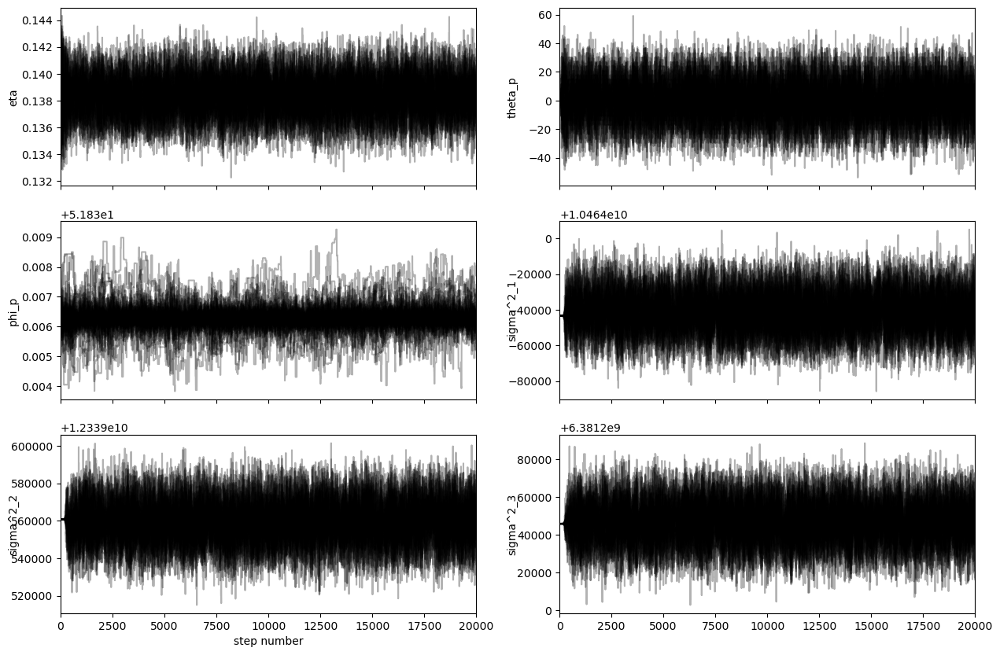

In [35]:
# Plot the resulting chains 
nrows = 3
ncols = 2

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10), sharex=True)
samples = sampler3.get_chain()
labels = ["eta", "theta_p", "phi_p"] + [f"sigma^2_{j}" for j in range(1, 4)]

for i in range(nrows):
    for j in range(ncols):
        ax = axes[i, j]
        index = i * ncols + j
        ax.plot(samples[:, :, index], "k", alpha=0.3)
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[index])
        ax.yaxis.set_label_coords(-0.1, 0.5)

# Add x-axis label to the last row
axes[-1, 0].set_xlabel("step number")
plt.show()

In [ ]:
labels = ["eta", "theta_p", "phi_p"] + [f"sigma^2_{j}" for j in range(1, 4)]
# Create a corner plot
thetas = sampler3.get_chain(flat=True, discard=200, thin=45)
corner.corner(thetas, labels=labels, truths=result.x)
plt.show()

The mixing is not good enough since we don't have small autocorrelation values this prevents the samples to cover efficiently the parameter space.

# Model comparison

<div class="alert alert-success">
    
**Exercise**. Prepare datasets for comparing your models. Discuss your train-test split strategy.

</div>

To split your data set into a training set and a test set, we will proceed as follows:

The training set will consist of the first 22 days of each month (72 % of a data set). The remaining days of each month will make up the test set.

In [36]:
data = data_.copy()

# Convert 'datetime' column to datetime format
data['datetime'] = pd.to_datetime(data['datetime'])

# Split the data set 
train_set = data[data["datetime"].dt.day <= 22]
test_set = data[data["datetime"].dt.day > 22]

print("Training set:")
print(train_set.shape)
print()
print("Test set:")
print(test_set.shape)

Training set:
(10569, 10)

Test set:
(4109, 10)


<div class="alert alert-success">
    
**Exercise**. Fit Model 1 (Homework 2), Model 2 and Model 3 on the appropriate dataset.

</div>

a. Fitting model 1 on the training set.

In [37]:
# Define model 1 : 
def simulate_mod1(F_t, theta_s, phi_s, theta):
    A = 2600
    if theta[0] < 0 or theta[0] > 1:
        print("eta must be in the range [0, 1]")
    else:
        cos_alpha = cosine_orientations(theta_s, phi_s, theta[1], theta[2])
        
        # Make sigma_2 time-dependent
        sigma_2_t = theta[3]
        
        # Simulate power production for each time step
        P_t = np.random.normal(A * F_t * theta[0] * (1 / np.sin(phi_s)) * cos_alpha, np.sqrt(sigma_2_t))

        return P_t

In [38]:
# Determine the estimated posterior probability distribution of parameters of model 1
np.random.seed(1)

# Model 1's likelihood
def log_likelihood_mod1(theta, F_t, theta_s, phi_s, P_t):
    cos_alpha = cosine_orientations(theta_s, phi_s, theta[1], theta[2])
    return norm.logpdf(P_t, loc= 2600 * theta[0] * F_t * (1 / np.sin(phi_s)) * cos_alpha, scale= np.sqrt(theta[3])).sum()

def neg_log_likelihood_mod1(theta, F_t, theta_s, phi_s, P_t):
    return -log_likelihood_mod1(theta, F_t, theta_s, phi_s, P_t)

# Fix initial values for each parameter
initial1 = [uniform(0, 1).rvs(), norm(0, np.pi).rvs(), norm(np.pi / 2, 1/8 * 1e-2).rvs() , train_set['power'].var()]

result = minimize(neg_log_likelihood_mod1, initial1, args=(train_set['irradiance'], train_set['sun_azimuth'], train_set['sun_elevation'], train_set['power']))
result

      fun: 133954.3332053659
 hess_inv: array([[ 8.85408076e-07, -1.47112939e-06, -3.42606527e-08,
        -2.05027398e-07],
       [-1.47112939e-06,  5.41855122e-03,  1.54127025e-05,
         9.68198952e-07],
       [-3.42606527e-08,  1.54127025e-05,  2.99570040e-07,
        -6.32644871e-09],
       [-2.05027398e-07,  9.68198952e-07, -6.32644871e-09,
         1.00000036e+00]])
      jac: array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 2.9870281e-07])
  message: 'Optimization terminated successfully.'
     nfev: 265
      nit: 28
     njev: 53
   status: 0
  success: True
        x: array([ 1.40086799e-01, -1.08038395e+02,  1.57017849e+00,  1.13413182e+10])

In [39]:
# Define the log-prior
def log_prior_mod1(theta):
    return (
        uniform.logpdf(theta[0], loc=0, scale=1) +
        norm.logpdf(theta[1], loc=0, scale=2 * np.pi) +
        norm.logpdf(theta[2], loc=np.pi / 2, scale=1e-2) +
        gamma.logpdf(theta[3], train_set['power'].var(), 1)
    )

# Define the log_posterior
def log_posterior_mod1(theta, F_t, theta_s, phi_s, P_t):
    lp = log_prior_mod1(theta)
    if not np.isfinite(lp):
        return -np.inf
    return log_likelihood_mod1(theta, F_t, theta_s, phi_s, P_t) + log_prior_mod1(theta)

In [40]:
nwalkers, ndim = 30, len(initial1)
pos = result.x + 0.01 * np.random.randn(nwalkers, ndim)

In [41]:
# Fitting model 1: 
sampler1 = emcee.EnsembleSampler(nwalkers, ndim, log_posterior_mod1, args=(train_set['irradiance'],train_set['sun_azimuth'],train_set['sun_elevation'],train_set['power']))
sampler1.run_mcmc(pos, 20000, progress=True);

100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [24:10<00:00, 13.79it/s]


In [42]:
tau1 = sampler1.get_autocorr_time()
tau1

array([108.68611336, 195.57572829, 260.84577963, 103.70092971])

The results show a moderate correlation between successive samples in the MCMC chain, requiring on average around 167 samples to obtain an independent sample. Hence the samples obtained are highly correlated. 

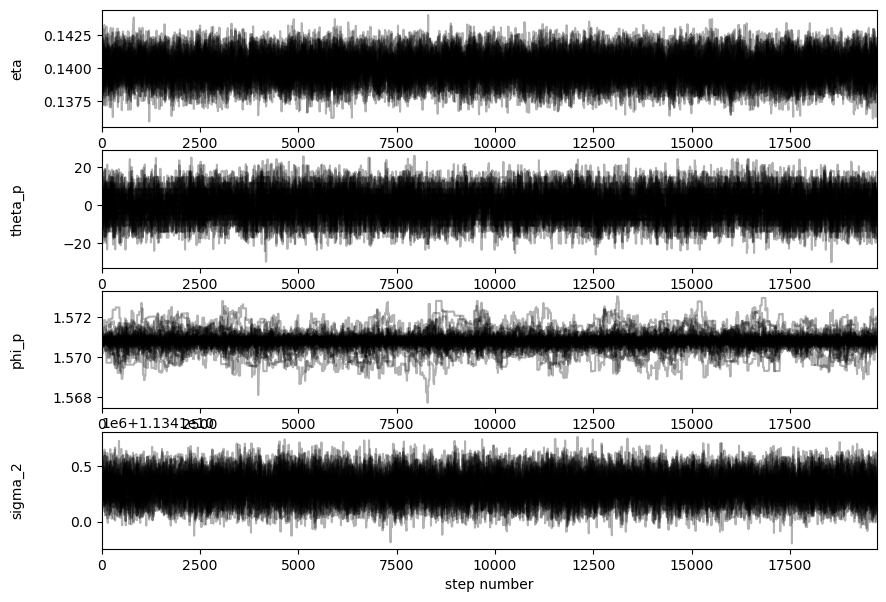

In [43]:
labels1 = ["eta", "theta_p", "phi_p", "sigma_2"]

fig, axes = plt.subplots(4, figsize=(10, 7))
thetas1 = sampler1.get_chain(discard=300)

for i in range(4):
    ax = axes[i]
    ax.plot(thetas1[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(thetas1))
    ax.set_ylabel(labels1[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
    ax.grid(False)

axes[-1].set_xlabel("step number")
plt.show()

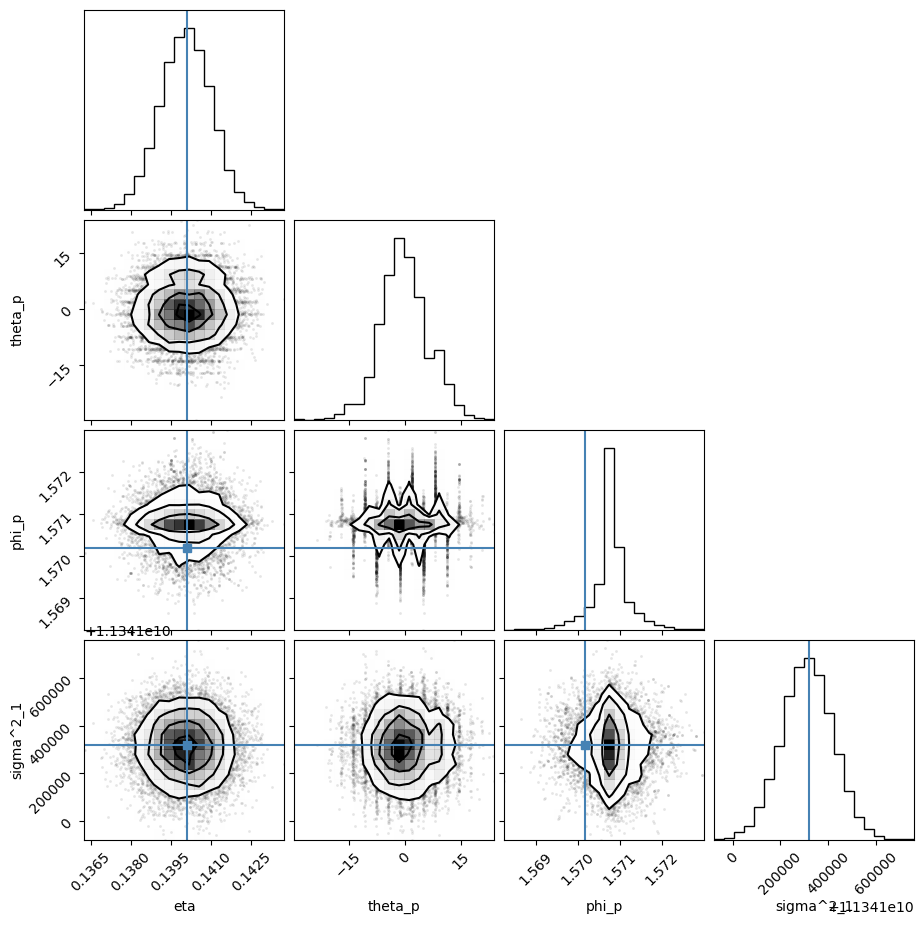

In [44]:
thetas1 = sampler1.get_chain(flat=True, discard=200, thin=45)
fig = corner.corner(thetas1, labels=labels, truths=result.x)

Good mixing and the autocorrelation times are relatively small.

b. Fitting model 2 on the training set 

In [45]:
np.random.seed(3)
# Initialize initial_params with the variance of each month
initial2 = [uniform(0, 1).rvs(), norm(0, np.pi).rvs(), norm(np.pi / 2, 1/8 * 1e-2).rvs()]

for j in range(1, 13):
    # Filter data for each month and calculate the variance of 'Power' column
    month_data = train_set[train_set['datetime'].dt.month == j]
    initial2.append(norm(month_data['power'].var(), 1e4).rvs())

# Run the optimization
result = minimize(neg_log_likelihood_mod2, initial2, args=(train_set['irradiance'], train_set['sun_azimuth'], train_set['sun_elevation'], train_set['power']))
result

      fun: 143745.23469460197
 hess_inv: array([[ 7.49455879e-06, -7.17496389e-06, -9.00229786e-08,
        -1.90496209e-07,  9.25644178e-12, -1.33367543e-13,
        -1.43462070e-13, -2.06135483e-14, -2.25024824e-13,
        -4.06832591e-14, -2.21837744e-13, -4.45900797e-15,
         9.50324072e-12,  8.50508536e-12, -1.90496353e-07],
       [-7.17496389e-06,  4.32707616e-02,  1.24126907e-04,
         1.26927501e-04,  3.91191758e-11, -1.10558651e-10,
        -6.27473069e-13, -4.70226967e-14, -8.79255782e-13,
        -8.59283031e-11, -8.21029082e-13, -1.88707011e-14,
        -9.66812981e-11, -3.30786654e-10,  1.26928400e-04],
       [-9.00229786e-08,  1.24126907e-04,  2.41991440e-06,
         1.80955909e-06,  3.78328349e-12, -3.94561683e-13,
        -6.56956192e-14,  4.93931604e-15, -6.80604368e-14,
        -3.17278805e-13, -5.18386170e-14, -1.83122572e-15,
         3.50470899e-12,  2.39071531e-12,  1.80956231e-06],
       [-1.90496209e-07,  1.26927501e-04,  1.80955909e-06,
         1.0

In [46]:
# Variances is a list containing the variance for each month
variances = []

for j in range(1, 13):
    # Filter data for each month and calculate the variance of 'Power' column
    month_data = train_set[train_set['datetime'].dt.month == j]
    variances.append(month_data['power'].var())

In [47]:
nwalkers, ndim = 60, len(initial2)
pos = result.x + 0.001 * np.random.randn(nwalkers, ndim)

In [48]:
# Fitting model 2
sampler2 = emcee.EnsembleSampler(nwalkers, ndim, log_posterior_mod2, args=(train_set['irradiance'], train_set['sun_azimuth'], train_set['sun_elevation'], train_set['power'], variances))
sampler2.run_mcmc(pos, 60000, progress=True);

100%|██████████████████████████████████████████████████████████████████████████| 60000/60000 [1:56:02<00:00,  8.62it/s]


In [49]:
tau2 = sampler2.get_autocorr_time()
tau2

array([386.39846772, 369.81927006, 940.15885258, 397.67313301,
       382.09072748, 383.02913869, 388.10418192, 429.92914201,
       367.75428047, 357.98810289, 392.93150802, 383.92530683,
       397.37244883, 393.3097533 , 394.26162785])

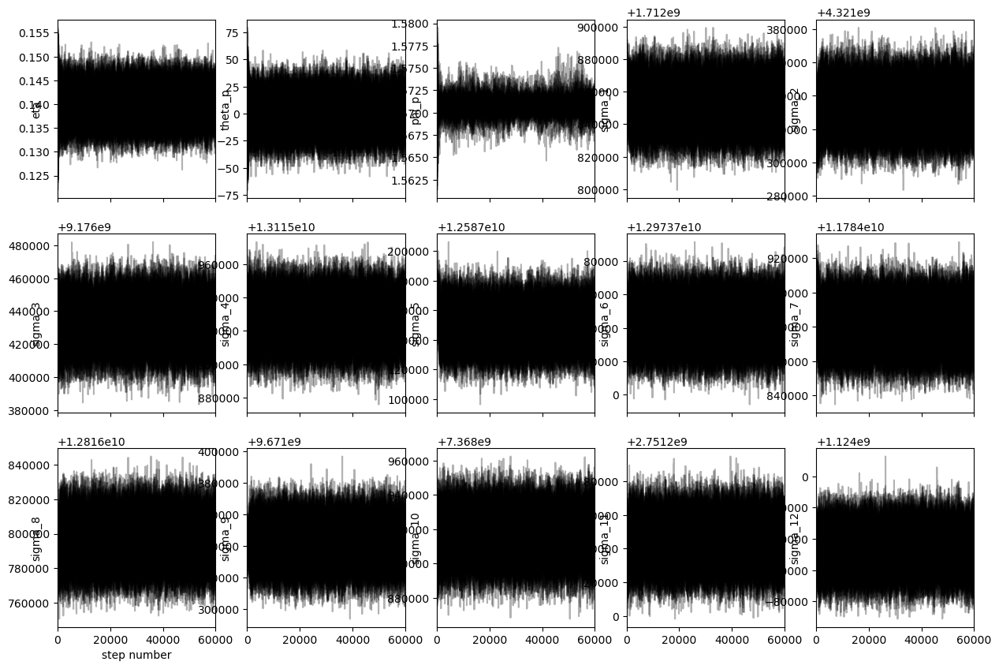

In [50]:
# Plot the resulting chains 
nrows = 3
ncols = 5

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10), sharex=True)
thetas2 = sampler2.get_chain()
labels2 = ["eta", "theta_p", "phi_p"] + [f"sigma_{j}" for j in range(1, 13)]

for i in range(nrows):
    for j in range(ncols):
        ax = axes[i, j]
        index = i * ncols + j
        ax.plot(thetas2[:, :, index], "k", alpha=0.3)
        ax.set_xlim(0, len(thetas2))
        ax.set_ylabel(labels2[index])
        ax.yaxis.set_label_coords(-0.1, 0.5)

# Add x-axis label to the last row
axes[-1, 0].set_xlabel("step number")
plt.show()

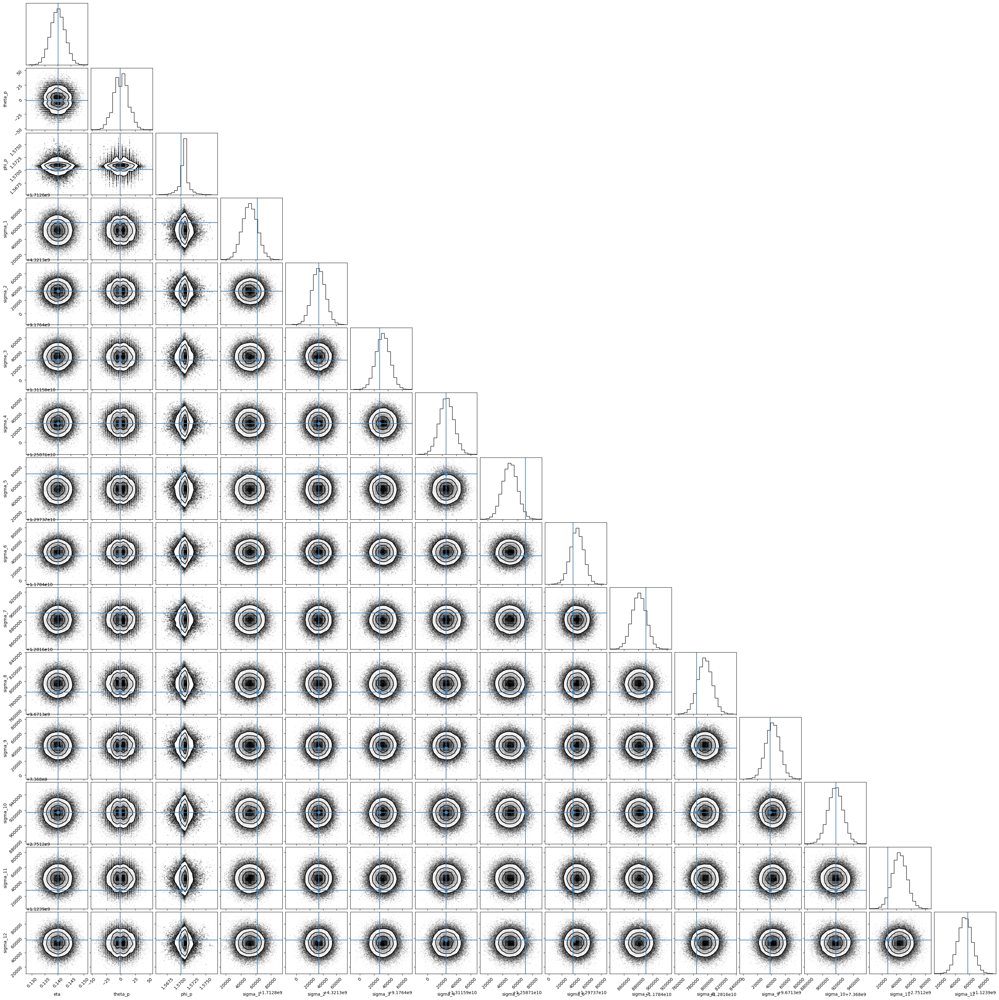

In [51]:
thetas2 = sampler2.get_chain(flat=True, discard=2000, thin=45)
corner.corner(thetas2, labels=labels2, truths=result.x)
plt.show()

Since the consecutive samples are highly correlated, this prevents the sample to cover efficciently the parameter space. Therefore we don't get a good mixing even though visual perception of the plot appears to be good.

c. Fitting model 3 on the training set.

In [52]:
# Calculate the size of each quarter
quarter_size = len(train_set) // 3

# Split the DataFrame into three equal parts
train_set_q1, train_set_q2, train_set_q3 = np.split(train_set, [quarter_size, 2*quarter_size])

# Print the lengths of the resulting DataFrames to verify they are equal
print(len(train_set_q1), len(train_set_q2), len(train_set_q3))
print(train_set_q1.head(4))
print()

quarter_size_test = len(test_set) // 3

# Split the DataFrame into three equal parts
test_set_q1, test_set_q2, test_set_q3 = np.split(test_set, [quarter_size_test, 2*quarter_size_test])

# Print the lengths of the resulting DataFrames to verify they are equal
print(len(test_set_q1), len(test_set_q2), len(test_set_q3))
print(test_set_q1.head(4))

3523 3523 3523
                   datetime  irradiance  irradiance_top    power  sun_azimuth  \
0 2022-01-01 08:45:00+00:00       23.47           99.59  31098.0     0.118582   
1 2022-01-01 09:00:00+00:00       46.19          169.79  35872.0     0.144492   
2 2022-01-01 09:15:00+00:00       67.58          217.01  38616.0     0.168565   
3 2022-01-01 09:30:00+00:00       84.97          245.87  42944.0     0.190690   

   sun_elevation  mahalanobis_distance formatted_date  month month_name  
0       2.441109              2.173863     2022-01-01      1    January  
1       2.495957              1.615580     2022-01-01      1    January  
2       2.551853              1.387798     2022-01-01      1    January  
3       2.608790              1.281123     2022-01-01      1    January  

1369 1369 1371
                     datetime  irradiance  irradiance_top   power  \
525 2022-01-23 08:30:00+00:00       18.13          159.19  2577.0   
526 2022-01-23 08:45:00+00:00      101.36          240.

In [53]:
def simulate_samples3(F_t, theta_s, phi_s, date, num):
    A = 2600
        
    eta_prior = stats.uniform(0, 1)
    theta_p_prior = stats.norm(0, 2 * np.pi)
    phi_p_prior = stats.norm(np.pi / 2, 1e-2)

    # Simulate samples from the prior distributions
    eta_samples = eta_prior.rvs(size=num)  # Generate num samples for eta
    theta_p_samples = theta_p_prior.rvs(size=num)  # Generate num samples for theta_p
    phi_p_samples = phi_p_prior.rvs(size=num)  # Generate num samples for phi_p

    month = date.dt.month  # Extract the month from the date

    # Simulate power production samples using the provided simulation function
    power_production_samples = []

    for i in range(num):
        power_samples_i = []

        if ((month >= 1) & (month <= 4)).any():
            sigma_2_prior = stats.norm(train_set_q1['power'].var(), 1e4) 
        elif ((month >= 5) & (month <= 8)).any():
            sigma_2_prior = stats.norm(train_set_q2['power'].var(), 1e4) 
        elif ((month >= 9) & (month <= 12)).any():
            sigma_2_prior = stats.norm(train_set_q3['power'].var(),1e4) 
        else:
            print("Date not in the specified range")
            return None

        sigma_2_samples = sigma_2_prior.rvs()

        # Pass theta as a list of parameter values for each sample
        power_sample_t = simulate_mod3(F_t, theta_s, phi_s, date, [eta_samples[i], theta_p_samples[i], phi_p_samples[i], sigma_2_samples])
        power_samples_i.append(power_sample_t)
        
        power_production_samples.append(power_samples_i)

    return power_production_samples

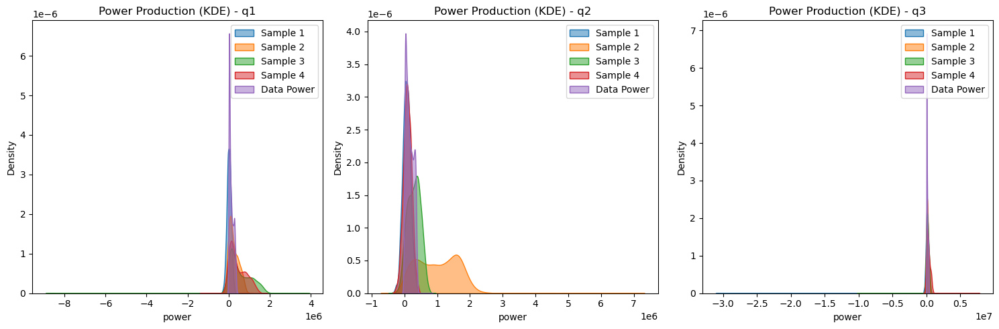

In [54]:
# Modify the prior distributions of model parameters
# List of tuples containing data for each quadrimestre along with the quadrimestre name
quadrimesters_data = [
    (train_set_q1, 'q1'),
    (train_set_q2, 'q2'),
    (train_set_q3, 'q3'),
]

# Create a figure with appropriate subplots
fig, axes = plt.subplots(1, len(quadrimesters_data), figsize=(15, 5))

for idx, (data, quadrimester) in enumerate(quadrimesters_data):
    n_samples = 4

    # Call the function
    result_ = simulate_samples3(data['irradiance'], data['sun_azimuth'], data['sun_elevation'], data['datetime'], num=n_samples)

    # Plot KDE for power production samples
    for i in range(n_samples):
        # Convert result_[i] to a NumPy array and then flatten it
        sns.kdeplot(np.array(result_[i]).flatten(), fill=True, alpha=0.5, label=f'Sample {i + 1}', ax=axes[idx])

    sns.kdeplot(data['power'], fill=True, alpha=0.5, label='Data Power', ax=axes[idx])
    axes[idx].set_title(f'Power Production (KDE) - {quadrimester}')
    axes[idx].legend()

plt.tight_layout()
plt.show()

In [55]:
# Initialize initial_params with the variance of each month
initial3 = [uniform(0, 1).rvs(), norm(0, 2*np.pi).rvs(), norm(np.pi / 2, 1e-2).rvs()]

initial3.append(stats.norm(train_set_q1['power'].var(),1e4).rvs())
initial3.append(stats.norm(train_set_q2['power'].var(),1e4).rvs())
initial3.append(stats.norm(train_set_q3['power'].var(),1e4).rvs())

# Minimize
result = minimize(neg_log_likelihood_mod3, initial3, args=(train_set['irradiance'], train_set['sun_azimuth'], train_set['sun_elevation'], train_set['power']))
result

      fun: 138303.50406619452
 hess_inv: array([[ 2.19729989e-06, -6.24150409e-08,  1.95841210e-09,
         6.08434982e-14,  2.79938313e-13, -8.59293165e-13],
       [-6.24150409e-08,  1.62002614e-02, -1.23654718e-06,
        -2.37543578e-14,  9.12280399e-12,  1.14248417e-14],
       [ 1.95841210e-09, -1.23654718e-06,  1.83556494e-08,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 6.08434982e-14, -2.37543578e-14,  0.00000000e+00,
         1.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 2.79938313e-13,  9.12280399e-12,  0.00000000e+00,
         0.00000000e+00,  1.00000000e+00,  0.00000000e+00],
       [-8.59293165e-13,  1.14248417e-14,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])
      jac: array([0.00000000e+00, 0.00000000e+00, 1.95312500e-03, 1.41690793e-07,
       1.41690757e-07, 1.41690917e-07])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 448
      nit: 45
     njev: 64
   s

In [56]:
# Define the log_prior
def log_prior_mod3(theta):
    log_prior_eta = uniform.logpdf(theta[0], loc=0, scale=1)
    log_prior_theta_p = norm.logpdf(theta[1], loc=0, scale=2 * np.pi)
    log_prior_phi_p = norm.logpdf(theta[2], loc=np.pi / 2, scale=1e-2)
    
    log_prior_sigma_1 = norm.logpdf(theta[3],train_set_q1['power'].var(),1e4)
    log_prior_sigma_2 = norm.logpdf(theta[4],train_set_q2['power'].var(),1e4)
    log_prior_sigma_3 = norm.logpdf(theta[5],train_set_q3['power'].var(),1e4)
    return log_prior_eta + log_prior_phi_p + log_prior_theta_p + log_prior_sigma_1+log_prior_sigma_2+log_prior_sigma_3

# Define the log_posterior 
def log_posterior_mod3(theta, F_t, theta_s, phi_s, P_t):
    lp = log_prior_mod3(theta)
    if not np.isfinite(lp):
        return -np.inf
    return log_likelihood_mod3(theta, F_t, theta_s, phi_s, P_t) + lp

In [57]:
nwalkers, ndim = 30, len(initial3)
pos = result.x + 0.001 * np.random.randn(nwalkers, ndim)

In [58]:
sampler3 = emcee.EnsembleSampler(nwalkers, ndim, log_posterior_mod3, args=(train_set['irradiance'], train_set['sun_azimuth'], train_set['sun_elevation'], train_set['power']))
sampler3.run_mcmc(pos, 20000, progress=True);

100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [23:39<00:00, 14.09it/s]


In [59]:
tau3 = sampler3.get_autocorr_time()
tau3

array([124.48483555, 150.9681546 , 329.31526634, 126.14098653,
       127.85280851, 136.04793928])

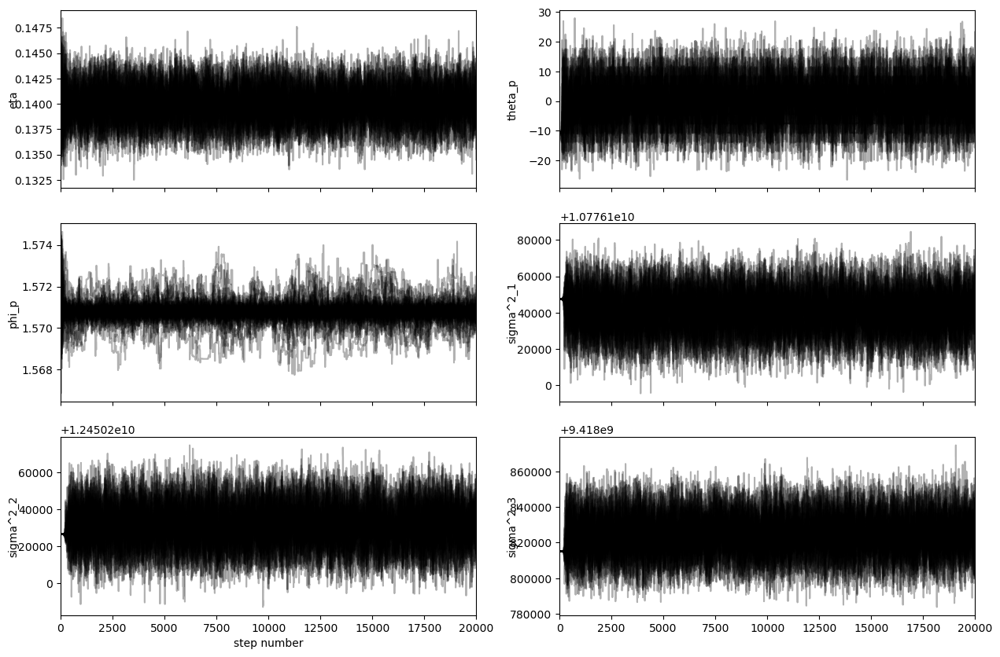

In [60]:
# Plot the resulting chains 
nrows = 3
ncols = 2

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10), sharex=True)
thetas3 = sampler3.get_chain()
labels3 = ["eta", "theta_p", "phi_p"] + [f"sigma^2_{j}" for j in range(1, 4)]

for i in range(nrows):
    for j in range(ncols):
        ax = axes[i, j]
        index = i * ncols + j
        ax.plot(thetas3[:, :, index], "k", alpha=0.3)
        ax.set_xlim(0, len(thetas3))
        ax.set_ylabel(labels3[index])
        ax.yaxis.set_label_coords(-0.1, 0.5)

# Add x-axis label to the last row
axes[-1, 0].set_xlabel("step number")
plt.show()

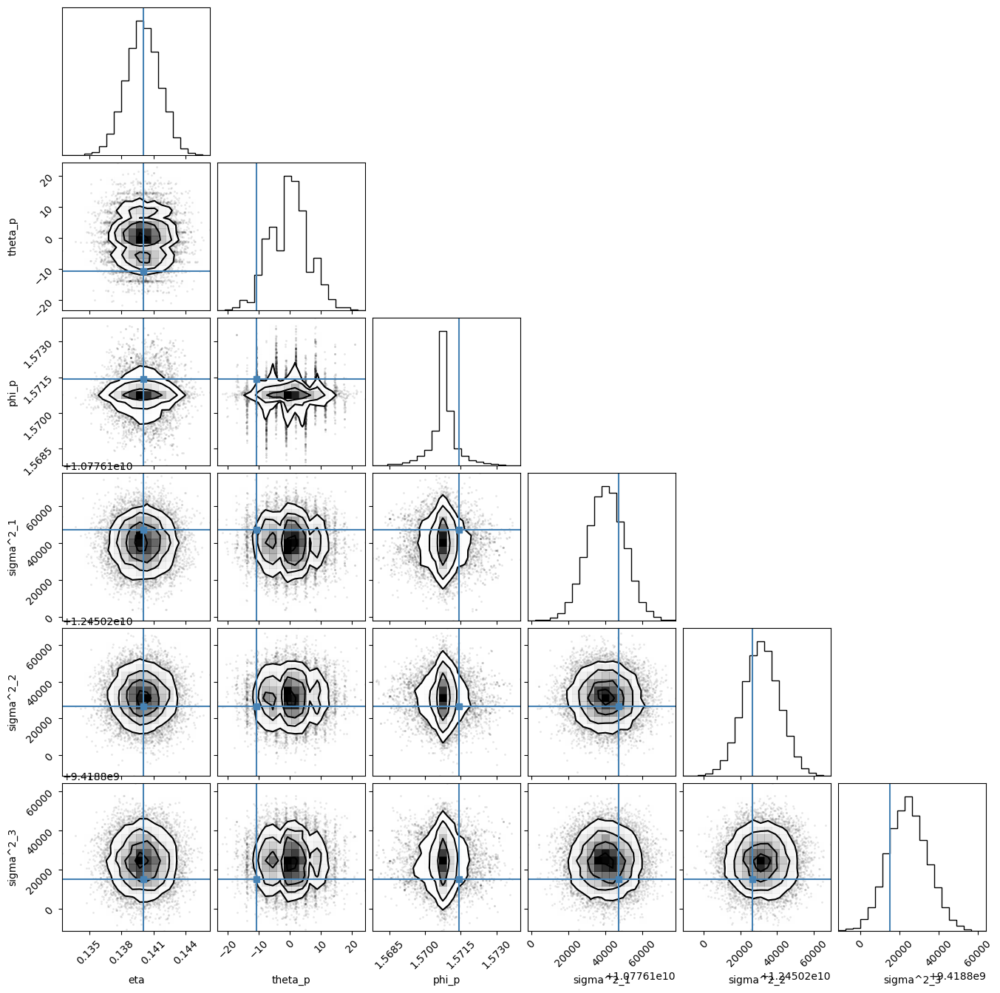

In [61]:
# Create a corner plot  
thetas3 = sampler3.get_chain(flat=True, discard=200, thin=45)
corner.corner(thetas3, labels=labels, truths = result.x)
plt.show()

The autocorrelation values are large. That means that the consecutive samples are significantly correlated and therefore do not provide enough information. That can prevent the sample to cover parameter space efficiently.

Hence the mixing is not good enough.

<div class="alert alert-success">
    
**Exercise**. Criticize the models and compare them qualitatively.

</div>

In order to critize and compare the models qualitatively, we will generate the kde of simulated power provided by each model and then compare with the one of the real power data of the test set. That will enable us to compare the modes, skewness and spread provided by each kde.

In [62]:
from sklearn.metrics import mean_squared_error

def pp1(F_t, theta_s, phi_s, P_t, num, thetas):
    permuted_indices = np.random.permutation(len(thetas))[:num]
    eta_post = thetas[permuted_indices, 0]
    theta_p_post = thetas[permuted_indices, 1]
    phi_p_post = thetas[permuted_indices, 2]
    sigma_2_post = thetas[permuted_indices, 3]

    power_production_samples = []
    biases = []  # To store biases for each sample set
    for i in range(num):
        samples_i = []
        for j in range(len(F_t)):
            power_sample_t = simulate_mod1(F_t[j], theta_s[j], phi_s[j], [eta_post[i], theta_p_post[i], phi_p_post[i], sigma_2_post[i]])
            samples_i.append(power_sample_t)
        power_production_samples.append(samples_i)
        bias = mean_squared_error(np.array(samples_i), P_t)  # Calculate bias using mean squared error
        biases.append(bias)

    return {'power_production_samples': power_production_samples, 'biases': biases}

Average bias gotten with the model 1 on the train set 15492577867.545162


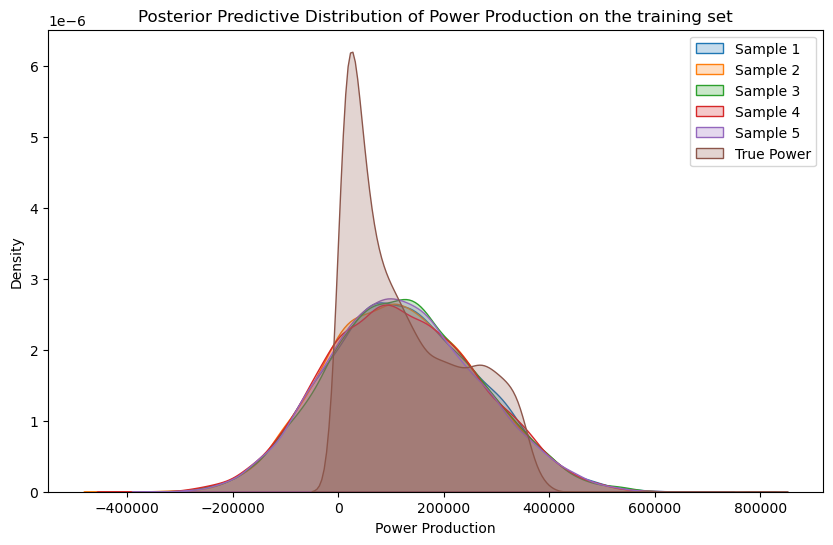

In [74]:
# Visual inspection of the posterior predictive distribution
# np.random.seed(2)
num = 5
F_t_train = train_set['irradiance'].values
theta_s_train = train_set['sun_azimuth'].values
phi_s_train = train_set['sun_elevation'].values
P_t_train = train_set['power'].values

# Generate power production samples
result_pp1  = pp1(F_t_train, theta_s_train, phi_s_train, P_t_train, num, thetas1)

# Extract power production samples and biases from the result
power_production_samples = result_pp1['power_production_samples']
bias1_train = result_pp1['biases']
print("Average bias gotten with the model 1 on the train set", np.mean(bias1_train))

# Plot the KDE of power production samples
plt.figure(figsize=(10, 6))
for i in range(num):
    sns.kdeplot(power_production_samples[i], label=f'Sample {i+1}', fill=True)

# Plot the true power production
sns.kdeplot(P_t_train, label='True Power', fill=True)

# Set labels and title
plt.xlabel('Power Production')
plt.ylabel('Density')
plt.title('Posterior Predictive Distribution of Power Production on the training set')
plt.legend()
plt.show()

Average bias gotten with the model 1 on the test set 16026467192.253946


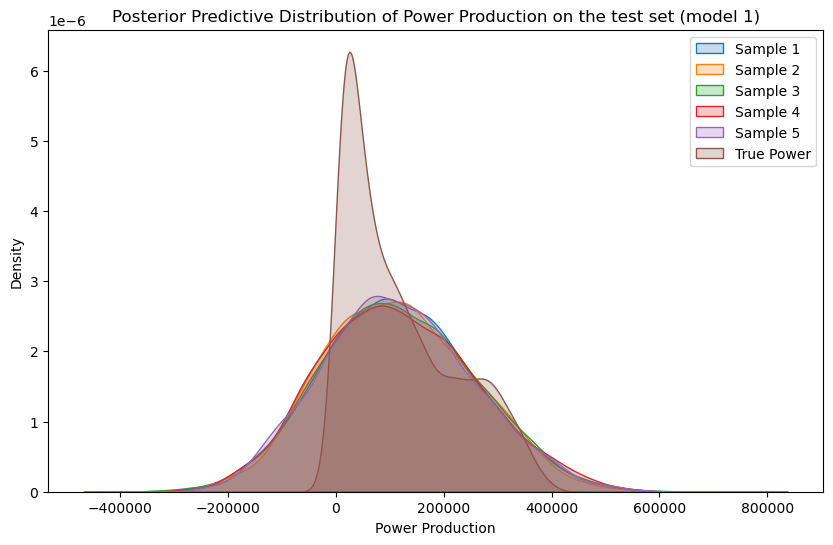

In [77]:
# Visual inspection of the posterior predictive distribution
# np.random.seed(2)
num = 5
F_t_test = test_set['irradiance'].values
theta_s_test = test_set['sun_azimuth'].values
phi_s_test = test_set['sun_elevation'].values
P_t_test = test_set['power'].values

# Generate power production samples
result_pp1  = pp1(F_t_test, theta_s_test, phi_s_test, P_t_test, num, thetas1)

# Extract power production samples and biases from the result
power_production_samples = result_pp1['power_production_samples']
bias1_test = result_pp1['biases']
print("Average bias gotten with the model 1 on the test set", np.mean(bias1_test))

# Plot the KDE of power production samples
plt.figure(figsize=(10, 6))
for i in range(num):
    sns.kdeplot(power_production_samples[i], label=f'Sample {i+1}', fill=True)

# Plot the true power production
sns.kdeplot(P_t_test, label='True Power', fill=True)

# Set labels and title
plt.xlabel('Power Production')
plt.ylabel('Density')
plt.title('Posterior Predictive Distribution of Power Production on the test set (model 1)')
plt.legend()
plt.show()

The first observation is that the kde of the simulated power data does not match that of the real power data. The MSE value obtained from this model 1 on the both sets are too high.

The kde of the simulated power data extends over all the values of the real power data, but we also get negative values among the simulated power data. This is a problem because all the real power data is positive.

Furthermore, the main problem with this model is that it is not able to follow the mode of the real power data.

In [65]:
# Posterior predictive distribution (model 2)
def pp2(F_t, theta_s, phi_s, date, P_t, num, thetas2):  
    # Permute parameter values
    permuted_indices = np.random.permutation(len(thetas2))[:num]

    # Set the estimated posterior distributions
    eta_post = thetas2[permuted_indices, 0]
    theta_p_post = thetas2[permuted_indices, 1] 
    phi_p_post = thetas2[permuted_indices, 2]
    sigma_2_post = thetas2[permuted_indices, 3:]

    # Simulate temperature samples
    y_samples = []

    for i in range(num):
        # Simulate joint distribution of all parameters
        theta_i = [eta_post[i], theta_p_post[i], phi_p_post[i]] + list(sigma_2_post[i])

        # Simulate temperature samples using the provided simulation function
        y_sample_i = simulate_mod2(F_t, theta_s, phi_s, date, theta_i)
        y_samples.append(y_sample_i)
    
    # Calculate biases using mean squared error
    biases = []
    for sample in y_samples:
        bias = mean_squared_error(sample, P_t)
        biases.append(bias)

    return {'power_production_samples': np.array(y_samples), 'biases': biases}

Average bias gotten with the model 2 on the train set 5810748857.212148


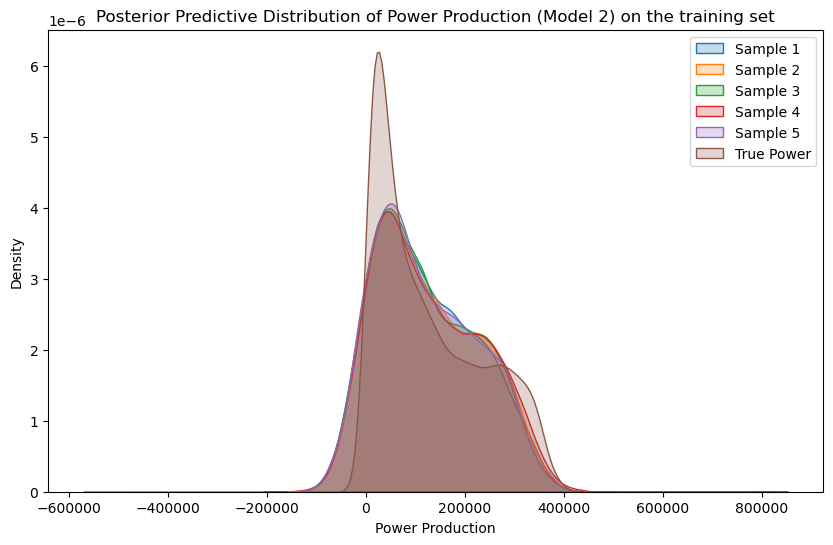

In [72]:
# Visual inspection of the posterior predictive distribution
# Generate temperature samples and biases
date = train_set['datetime']
result_pp2 = pp2(F_t_train, theta_s_train, phi_s_train, date, P_t_train, num, thetas2)
y_samples_pp2 = result_pp2['power_production_samples']
bias2_train = result_pp2['biases']
print("Average bias gotten with the model 2 on the train set", np.mean(bias2_train))

# Plot the KDE of temperature samples for model 2
plt.figure(figsize=(10, 6))
for i in range(num):
    sns.kdeplot(y_samples_pp2[i], label=f'Sample {i+1}', fill=True)

# Plot the true power production
sns.kdeplot(P_t_train, label='True Power', fill=True)

# Set labels and title
plt.xlabel('Power Production')
plt.ylabel('Density')
plt.title('Posterior Predictive Distribution of Power Production (Model 2) on the training set')
plt.legend()
plt.show()

Average bias gotten with the model 2 on the test set 6345205506.679903


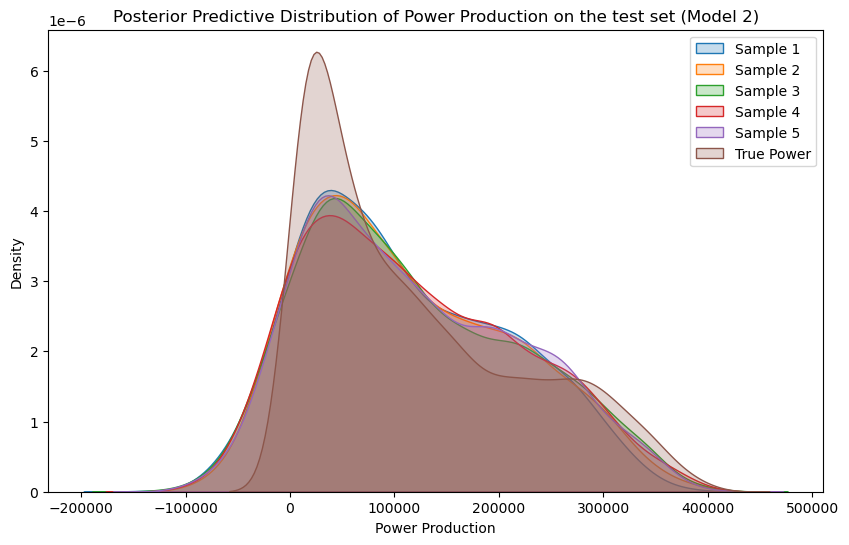

In [76]:
# Generate power production samples
result_pp2  = pp2(F_t_test, theta_s_test, phi_s_test, date, P_t_test, num, thetas2)

# Extract power production samples and biases from the result
power_production_samples = result_pp2['power_production_samples']
bias2_test = result_pp2['biases']
print("Average bias gotten with the model 2 on the test set", np.mean(bias2_test))

# Plot the KDE of power production samples
plt.figure(figsize=(10, 6))
for i in range(num):
    sns.kdeplot(power_production_samples[i], label=f'Sample {i+1}', fill=True)

# Plot the true power production
sns.kdeplot(P_t_test, label='True Power', fill=True)

# Set labels and title
plt.xlabel('Power Production')
plt.ylabel('Density')
plt.title('Posterior Predictive Distribution of Power Production on the test set (Model 2)')
plt.legend()
plt.show()

The simulated power data obtained with model 2 produces kde much more similar to that of the real power data both on the training and test sets. These kdes obtained have the same mode as those of the real data but these modes do not have the same density, 6 x $10^{-6}$ for the real power data and 4 x $10^{-4}$ for the simulated power data. The spread of the values obtained is almost the same and also almost the same in terms of densities. We note the presence of negative values, but to a lesser extent than those obtained with model 1.

In [78]:
# Posterior predictive distribution (model 3)
def pp3(F_t, theta_s, phi_s, date, P_t, num, thetas3):  
    # Permute parameter values
    permuted_indices = np.random.permutation(len(thetas3))[:num]

    # Set the estimated posterior distributions
    eta_post = thetas3[permuted_indices, 0]
    theta_p_post = thetas3[permuted_indices, 1] 
    phi_p_post = thetas3[permuted_indices, 2]
    sigma_2_post = thetas3[permuted_indices, 3:]

    # Simulate temperature samples
    y_samples = []

    # Calculate biases using mean squared error
    biases = []

    for i in range(num):
        # Simulate joint distribution of all parameters
        theta_i = [eta_post[i], theta_p_post[i], phi_p_post[i]] + list(sigma_2_post[i])

        # Simulate temperature samples using the provided simulation function
        y_sample_i = simulate_mod3(F_t, theta_s, phi_s, date, theta_i)
        y_samples.append(y_sample_i)
        
        # Calculate bias using mean squared error
        bias = mean_squared_error(y_sample_i, P_t)
        biases.append(bias)
           
    return {'power_production_samples': np.array(y_samples), 'biases': biases}

Average bias gotten with the model 3 on the train set 15072271010.894278


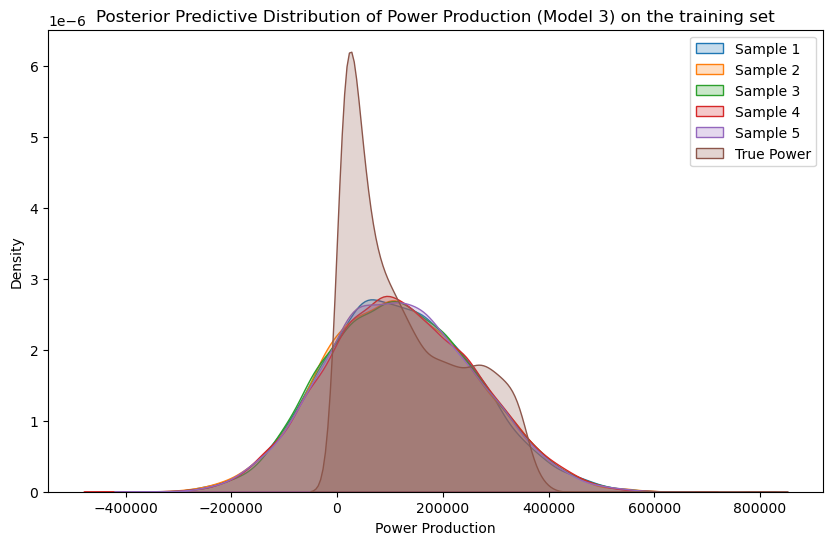

In [79]:
# Visual inspection of the posterior predictive distribution
# Generate temperature samples and biases for model 3
result_pp3 = pp3(F_t_train, theta_s_train, phi_s_train, date, P_t_train, num, thetas3)
y_samples_pp3 = result_pp3['power_production_samples']
bias3_train = result_pp3['biases']
print("Average bias gotten with the model 3 on the train set", np.mean(bias3_train))

# Plot the KDE of temperature samples for model 3
plt.figure(figsize=(10, 6))
for i in range(num):
    sns.kdeplot(y_samples_pp3[i], label=f'Sample {i+1}', fill=True)

# Plot the true power production
sns.kdeplot(P_t_train, label='True Power', fill=True)

# Set labels and title
plt.xlabel('Power Production')
plt.ylabel('Density')
plt.title('Posterior Predictive Distribution of Power Production (Model 3) on the training set')
plt.legend()
plt.show()

Average bias gotten with the model 3 on the train set 15153479239.360779


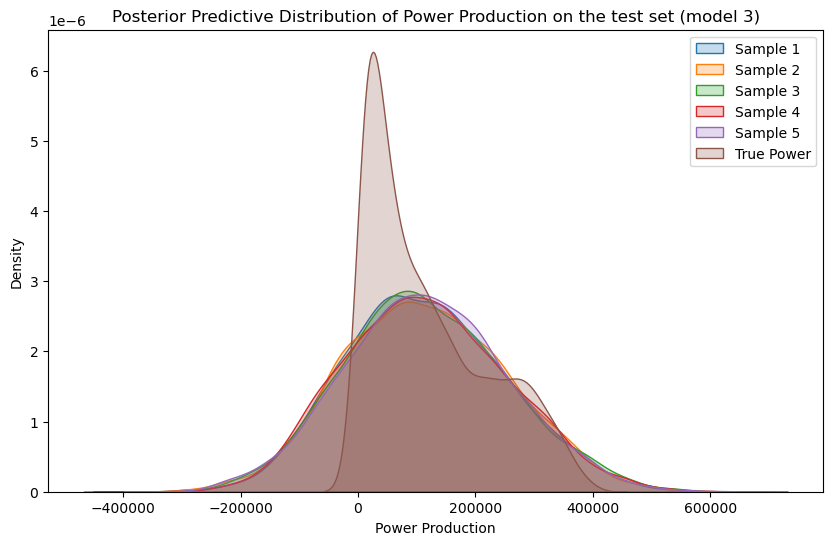

In [81]:
# Generate power production samples
result_pp3  = pp3(F_t_test, theta_s_test, phi_s_test, date, P_t_test, num, thetas3)

# Extract power production samples and biases from the result
power_production_samples = result_pp3['power_production_samples']
bias3_test = result_pp3['biases']
print("Average bias gotten with the model 3 on the train set", np.mean(bias3_test))

# Plot the KDE of power production samples
plt.figure(figsize=(10, 6))
for i in range(num):
    sns.kdeplot(power_production_samples[i], label=f'Sample {i+1}', fill=True)

# Plot the true power production
sns.kdeplot(P_t_test, label='True Power', fill=True)

# Set labels and title
plt.xlabel('Power Production')
plt.ylabel('Density')
plt.title('Posterior Predictive Distribution of Power Production on the test set (model 3)')
plt.legend()
plt.show()

In short, the model 2 provides us a better performance in term of MSE on the training and test sets since it has the smallest MSE values on the them.

Hence the model 2 is best among the three models qualitatively. It fits well the data on the both sets.

<div class="alert alert-success">
    
**Exercise**. Compare the models quantitatively. Discuss and justify your comparison protocol. In particular, discuss your metric(s).

</div>

In order to compare the models quantitatively, we will assess the expected log predictive density of each model and cross-validation.

Model 1

In [93]:
# Define the log-posterior predictive density function for model 1
def log_posterior_predictive_mod1(P_t, F_t, theta_s, phi_s, thetas):
    log_pred_densities = [log_likelihood_mod1(theta, F_t, theta_s, phi_s, P_t) for theta in thetas]
    return np.mean(log_pred_densities)

# Define the ELPD calculation function for model 1
def elpd_mod1(xs_train, xs_test, thetas):
    return np.mean([log_posterior_predictive_mod1(P_t, F_t, theta_s, phi_s, thetas) 
                    for P_t, F_t, theta_s, phi_s in xs_test])

In [94]:
# Initialize KFold with 10 folds and shuffle the data
kf = KFold(n_splits=10, shuffle=True)
data = test_set[['power', 'irradiance', 'sun_azimuth', 'sun_elevation']]

# Initialize list to store ELPD scores for each fold
elpd_test = []
data_array = data.to_numpy()

for train_idx, test_idx in tqdm(kf.split(data_array), desc="Cross-validation progress"):
    # Prepare train and test sets
    xs_train = data_array[train_idx]
    xs_test = data_array[test_idx]
    
    # Get subset of MCMC samples from sampler1 for the current fold
    subset = np.random.permutation(len(sampler1.get_chain(flat=True)))[:10000]
    thetas_subset = sampler1.get_chain(flat=True)[subset]
    
    # Calculate ELPD for the current fold
    elpd_test_fold = elpd_mod1(xs_train, xs_test, thetas_subset)
    elpd_test.append(elpd_test_fold)

# Calculate average and standarrd deviation ELPD across all folds
average_elpd = np.mean(elpd_test)

print("Average ELPD for modified model 1 (across folds):", np.mean(elpd_test))
print("Standard deviation ELPD for modified model 1 (across folds):", np.std(elpd_test))

Cross-validation progress: 10it [50:42, 304.20s/it]

Average ELPD for modified model 1 (across folds): -12.695796293911906
Standard deviation ELPD for modified model 1 (across folds): 0.016690530935174672


Model 2

In [95]:
# Define the log-posterior predictive density function for model 2
def log_posterior_predictive_mod2(P_t, F_t, theta_s, phi_s, thetas):
    log_pred_densities = [log_likelihood_mod2(theta, F_t, theta_s, phi_s, P_t) for theta in thetas]
    return np.mean(log_pred_densities)

# Define the ELPD calculation function for model 2
def elpd_mod2(xs_train, xs_test, thetas):
    return np.mean([log_posterior_predictive_mod2(P_t, F_t, theta_s, phi_s, thetas) 
                    for P_t, F_t, theta_s, phi_s in xs_test])

In [96]:
# Initialize KFold with 10 folds and shuffle the data
kf = KFold(n_splits=10, shuffle=True)
data = test_set[['power', 'irradiance', 'sun_azimuth', 'sun_elevation']]

# Initialize list to store ELPD scores for each fold
elpd_test = []
data_array = data.to_numpy()

for train_idx, test_idx in tqdm(kf.split(data_array), desc="Cross-validation progress"):
    # Prepare train and test sets
    xs_train = data_array[train_idx]
    xs_test = data_array[test_idx]
    
    # Get subset of MCMC samples from sampler1 for the current fold
    subset = np.random.permutation(len(sampler2.get_chain(flat=True)))[:10000]
    thetas_subset = sampler2.get_chain(flat=True)[subset]
    
    # Calculate ELPD for the current fold
    elpd_test_fold = elpd_mod2(xs_train, xs_test, thetas_subset)
    elpd_test.append(elpd_test_fold)

# Calculate average and standard deviation ELPD across all folds
average_elpd = np.mean(elpd_test)

print("Average ELPD for modified model 2 (across folds):", np.mean(elpd_test))
print("Standard deviation ELPD for modified model 2 (across folds):", np.std(elpd_test))

Cross-validation progress: 10it [56:11, 337.16s/it]

Average ELPD for modified model 2 (across folds): -13.603163031641369
Standard deviation ELPD for modified model 2 (across folds): 0.00273950908111534


Model 3

In [97]:
# Define the log-posterior predictive density function for model 3
def log_posterior_predictive_mod3(P_t, F_t, theta_s, phi_s, thetas):
    log_pred_densities = [log_likelihood_mod3(theta, F_t, theta_s, phi_s, P_t) for theta in thetas]
    return np.mean(log_pred_densities)

# Define the ELPD calculation function for model 3
def elpd_mod3(xs_train, xs_test, thetas):
    return np.mean([log_posterior_predictive_mod3(P_t, F_t, theta_s, phi_s, thetas) 
                    for P_t, F_t, theta_s, phi_s in xs_test])

In [98]:
# Initialize KFold with 10 folds and shuffle the data
kf = KFold(n_splits=10, shuffle=True)
data = test_set[['power', 'irradiance', 'sun_azimuth', 'sun_elevation']]

# Initialize list to store ELPD scores for each fold
elpd_test = []
data_array = data.to_numpy()

for train_idx, test_idx in tqdm(kf.split(data_array), desc="Cross-validation progress"):
    # Prepare train and test sets
    xs_train = data_array[train_idx]
    xs_test = data_array[test_idx]
    
    # Get subset of MCMC samples from sampler1 for the current fold
    subset = np.random.permutation(len(sampler3.get_chain(flat=True)))[:10000]
    thetas_subset = sampler3.get_chain(flat=True)[subset]
    
    # Calculate ELPD for the current fold
    elpd_test_fold = elpd_mod3(xs_train, xs_test, thetas_subset)
    elpd_test.append(elpd_test_fold)

# Calculate average and standard deviation ELPD across all folds
average_elpd = np.mean(elpd_test)
print("Average ELPD for modified model 3 (across folds):", np.mean(elpd_test))
print("Standard deviation ELPD for modified model 3 (across folds):", np.std(elpd_test))

Cross-validation progress: 10it [58:13, 349.31s/it]

Average ELPD for modified model 3 (across folds): -13.09328394399204
Standard deviation ELPD for modified model 3 (across folds): 0.007009912933796317


From a quantitative point of view, the comparison is a little more complex. The Markov chains used to obtain the parameters of model 2 do not explore the hypothesis space efficiently and require more iterations in order to obtain independent samples. 
It should be noted that the ELPD of model 2 is the lowest of the three and has a much lower variance than the other two models across parts of the data set.